#  Wallmart Store Sales Prediction

Dataset contains details of wallmart store accross the country and are facing issues in managing the inventory - to match the demand with respect to supply.You are provided with the weekly sales data for their various outlets .Use statistical analysis, EDA, outlier analysis, and handle the missing values to come up with various insights that can give them a clear perspective about the demand handling manaagement.

In [1]:
#loading the required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
#loading the dataset
df = pd.read_csv('Walmart.csv')
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


In [3]:
df.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [5]:
df.shape

(6435, 8)

In [6]:
df.duplicated().sum()

0

No duplicate rows in our dataset

In [7]:
#number of stores in the dataset
df['Store'].nunique()

45

In [8]:
# number of weeks for which data is present.
df['Date'].nunique()

143

In [9]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [10]:
#lower casing the features headings
df.columns = df.columns.str.lower()

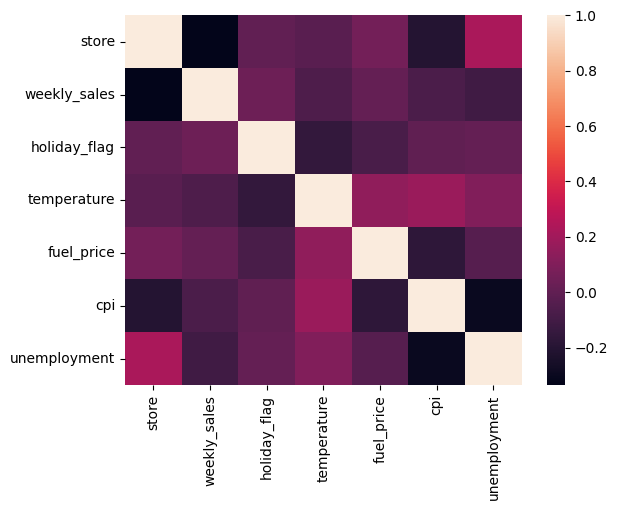

                     store  weekly_sales  holiday_flag  temperature  \
store         1.000000e+00     -0.335332 -4.386841e-16    -0.022659   
weekly_sales -3.353320e-01      1.000000  3.689097e-02    -0.063810   
holiday_flag -4.386841e-16      0.036891  1.000000e+00    -0.155091   
temperature  -2.265908e-02     -0.063810 -1.550913e-01     1.000000   
fuel_price    6.002295e-02      0.009464 -7.834652e-02     0.144982   
cpi          -2.094919e-01     -0.072634 -2.162091e-03     0.176888   
unemployment  2.235313e-01     -0.106176  1.096028e-02     0.101158   

              fuel_price       cpi  unemployment  
store           0.060023 -0.209492      0.223531  
weekly_sales    0.009464 -0.072634     -0.106176  
holiday_flag   -0.078347 -0.002162      0.010960  
temperature     0.144982  0.176888      0.101158  
fuel_price      1.000000 -0.170642     -0.034684  
cpi            -0.170642  1.000000     -0.302020  
unemployment   -0.034684 -0.302020      1.000000  


In [11]:
#visualising the correlation among the feeatures
corr = df.corr()
sns.heatmap(corr)
plt.show()
print(corr)

In [12]:
#Checking the correlation for each store's weekly sales with their respectibe unemployment ratio
store_correlations = {} #making a empty dictionary
for i in range(1,46):
  store_data = df[df['store']==i]
  correlation = store_data['weekly_sales'].corr(store_data['unemployment'])
  store_correlations[i] = correlation

print(store_correlations)

{1: -0.0979553947295795, 2: 0.06632485967770846, 3: -0.2304130134863526, 4: -0.3370151956445587, 5: -0.20704271031605842, 6: 0.044250821015624046, 7: -0.16538168270129636, 8: -0.05257964619712677, 9: -0.1915343637022839, 10: 0.13190762207746096, 11: -0.020338971133082306, 12: -0.009286099902746538, 13: -0.1716328688963503, 14: 0.2107864829459358, 15: 0.0789053686051426, 16: -0.07086358405192238, 17: -0.26359968183073906, 18: 0.13917900226669452, 19: 0.10146392090273439, 20: -0.09534134450284637, 21: 0.21836733305703376, 22: 0.039042867355347455, 23: -0.07716899559088829, 24: -0.012260801238922888, 25: -0.004957651760361549, 26: -0.06689910263473302, 27: -0.0142750519412613, 28: 0.1366706817794531, 29: 0.08468168200648409, 30: 0.20186223641523895, 31: -0.06473780907548937, 32: -0.09945467124759011, 33: 0.10117473193757327, 34: 0.01701025065278913, 35: 0.4838654198192479, 36: 0.8337336178415085, 37: -0.22128669565468617, 38: -0.7852902748572028, 39: -0.38468135708616064, 40: -0.112527950

In [13]:
#sorting the correlations dictionary
sorted_stores = sorted(store_correlations.items(), key=lambda x: x[1], reverse=True)
sorted_stores

[(36, 0.8337336178415085),
 (35, 0.4838654198192479),
 (21, 0.21836733305703376),
 (14, 0.2107864829459358),
 (30, 0.20186223641523895),
 (18, 0.13917900226669452),
 (28, 0.1366706817794531),
 (10, 0.13190762207746096),
 (19, 0.10146392090273439),
 (33, 0.10117473193757327),
 (29, 0.08468168200648409),
 (15, 0.0789053686051426),
 (2, 0.06632485967770846),
 (6, 0.044250821015624046),
 (22, 0.039042867355347455),
 (34, 0.01701025065278913),
 (45, -0.004041028359856243),
 (25, -0.004957651760361549),
 (12, -0.009286099902746538),
 (24, -0.012260801238922888),
 (27, -0.0142750519412613),
 (11, -0.020338971133082306),
 (8, -0.05257964619712677),
 (31, -0.06473780907548937),
 (26, -0.06689910263473302),
 (16, -0.07086358405192238),
 (23, -0.07716899559088829),
 (20, -0.09534134450284637),
 (1, -0.0979553947295795),
 (32, -0.09945467124759011),
 (40, -0.11252795058812329),
 (7, -0.16538168270129636),
 (13, -0.1716328688963503),
 (9, -0.1915343637022839),
 (43, -0.20195435737205705),
 (5, -0.2

In [14]:
print("Stores with the strongest negative correlation between Weekly Sales and Unemployment:")
for store, correlation in sorted_stores:
    print(f"Store {store}: Correlation = {correlation:.3f}")

Stores with the strongest negative correlation between Weekly Sales and Unemployment:
Store 36: Correlation = 0.834
Store 35: Correlation = 0.484
Store 21: Correlation = 0.218
Store 14: Correlation = 0.211
Store 30: Correlation = 0.202
Store 18: Correlation = 0.139
Store 28: Correlation = 0.137
Store 10: Correlation = 0.132
Store 19: Correlation = 0.101
Store 33: Correlation = 0.101
Store 29: Correlation = 0.085
Store 15: Correlation = 0.079
Store 2: Correlation = 0.066
Store 6: Correlation = 0.044
Store 22: Correlation = 0.039
Store 34: Correlation = 0.017
Store 45: Correlation = -0.004
Store 25: Correlation = -0.005
Store 12: Correlation = -0.009
Store 24: Correlation = -0.012
Store 27: Correlation = -0.014
Store 11: Correlation = -0.020
Store 8: Correlation = -0.053
Store 31: Correlation = -0.065
Store 26: Correlation = -0.067
Store 16: Correlation = -0.071
Store 23: Correlation = -0.077
Store 20: Correlation = -0.095
Store 1: Correlation = -0.098
Store 32: Correlation = -0.099
Stor

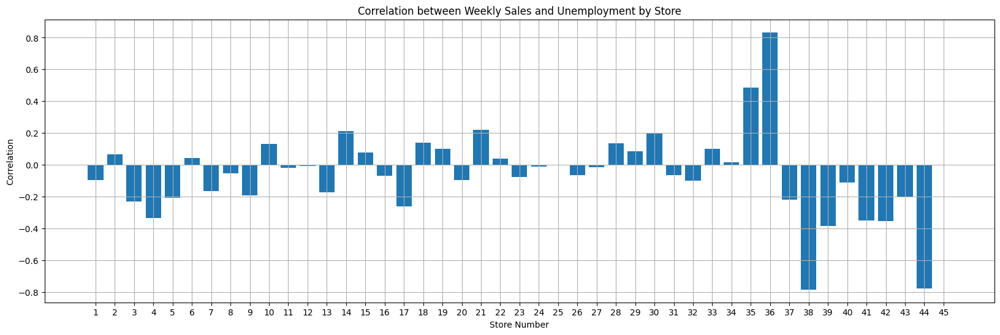

In [15]:
store_numbers = list(store_correlations.keys()) #fetching the dictionary keys
correlations = list(store_correlations.values())#fetching the dictionary values


plt.figure(figsize=(20, 6))
plt.bar(store_numbers, correlations, tick_label=store_numbers)
plt.title("Correlation between Weekly Sales and Unemployment by Store")
plt.xlabel("Store Number")
plt.ylabel("Correlation")
plt.grid()
plt.show()

From the above graph we can conculde that yes Weekly_sales are getting affected by the Unemployment Rate. It has been notices that if the unemployment rate is higher the weekly sales go down. And the stores that are most affected are- Store no, 36, 35,21,14.

In [16]:
#checking the stationarity for all 45 stores using adfuller test

from statsmodels.tsa.stattools import adfuller

store_seasonality = []

for store in range(1,46):
  store_data = df[df['store']==store]
  result = adfuller(store_data['weekly_sales'])
  adf_statistic = result[0]
  p_value = result[1]
  store_seasonality.append({'store_no.':store, 'adf_statistics':adf_statistic, 'p-value' : p_value })

for result in store_seasonality:
    store = result['store_no.']
    adf_statistic = result['adf_statistics']
    p_value = result['p-value']

    print(f"store_no. {store}:")
    print("adf_statistics:", adf_statistic)
    print("p-value:", p_value)
    if p_value < 0.05:
        print("The time series is likely stationary (no seasonality).")
    else:
        print("The time series may not be stationary (may have seasonality).")
    print()

store_no. 1:
adf_statistics: -5.102186145192288
p-value: 1.3877788330759434e-05
The time series is likely stationary (no seasonality).

store_no. 2:
adf_statistics: -3.7088625726189153
p-value: 0.003990207089066268
The time series is likely stationary (no seasonality).

store_no. 3:
adf_statistics: -2.963867745511323
p-value: 0.03840926179831256
The time series is likely stationary (no seasonality).

store_no. 4:
adf_statistics: -2.8793819840147123
p-value: 0.04779866223669836
The time series is likely stationary (no seasonality).

store_no. 5:
adf_statistics: -4.310974424060915
p-value: 0.00042517056141923293
The time series is likely stationary (no seasonality).

store_no. 6:
adf_statistics: -5.492502135779504
p-value: 2.1594858682169703e-06
The time series is likely stationary (no seasonality).

store_no. 7:
adf_statistics: -4.476254338547255
p-value: 0.0002170071890711771
The time series is likely stationary (no seasonality).

store_no. 8:
adf_statistics: -5.647652940025236
p-value

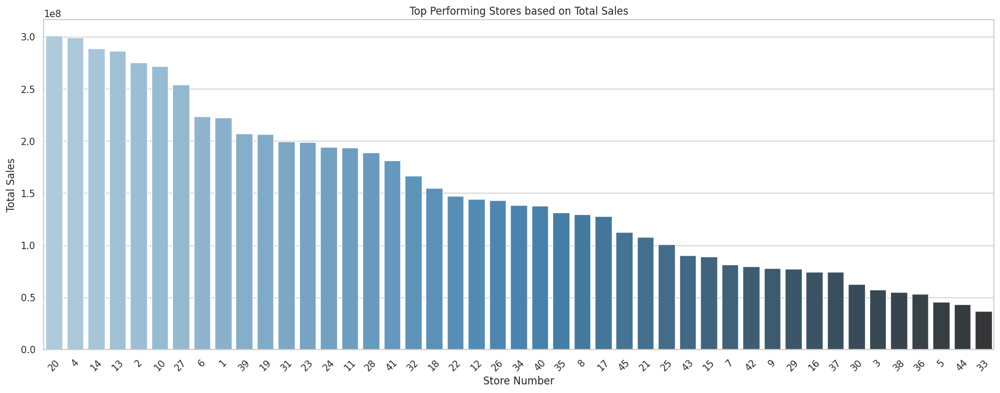

In [17]:
#checking the top performing stores

store_sales = df.groupby('store')['weekly_sales'].sum().reset_index()

sorted_store_sales = store_sales.sort_values(['weekly_sales'], ascending = False)

sns.set(style="whitegrid")

# Create a bar chart to visualize the top-performing stores
plt.figure(figsize=(20, 7))
sns.barplot(x='store', y='weekly_sales', data=sorted_store_sales, order =sorted_store_sales['store'], palette="Blues_d")
plt.title("Top Performing Stores based on Total Sales")
plt.xlabel("Store Number")
plt.ylabel("Total Sales")
plt.xticks(rotation=45)
plt.show()

We can see from the above graph that the top performing stores are store no.- 20, 4, 14, 13, 2

Worst Performing Store: 33
Best Performing Store: 20
Difference Between Highest and Lowest Performing Stores: 264237570.49999997



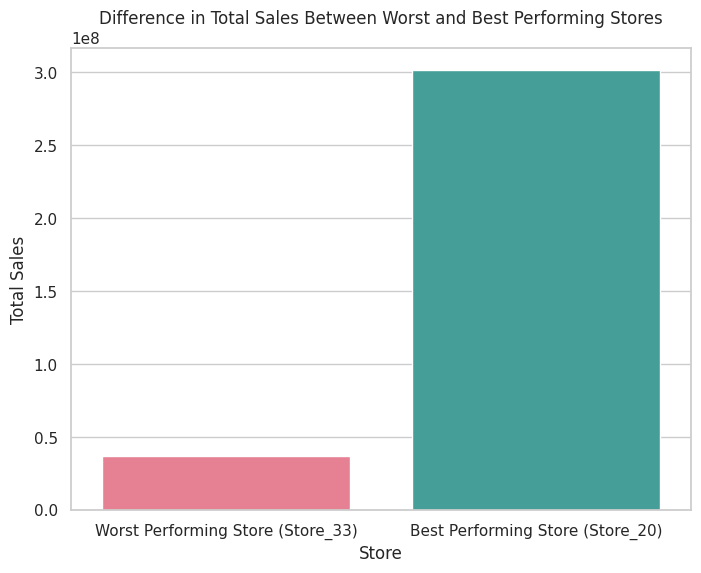

In [18]:
#Checking the difference in Total Sales Between Worst and Best Performing Stores
store_sales = df.groupby('store')['weekly_sales'].sum().reset_index()

#sorting the best and the worst performing store
best_performer = store_sales.loc[store_sales['weekly_sales'].idxmax()]
worst_performer = store_sales.loc[store_sales['weekly_sales'].idxmin()]

#checking the difference between their weekly sales
difference = best_performer['weekly_sales'] - worst_performer['weekly_sales']

print("Worst Performing Store:", int(worst_performer['store']))
print("Best Performing Store:", int(best_performer['store']))
print("Difference Between Highest and Lowest Performing Stores:", difference)
print()

palette = sns.color_palette("husl", 2)

plt.figure(figsize=(8, 6))
sns.barplot(x= ['Worst Performing Store (Store_33)', 'Best Performing Store (Store_20)'], y=[worst_performer['weekly_sales'], best_performer['weekly_sales']], palette=palette)
plt.title("Difference in Total Sales Between Worst and Best Performing Stores")
plt.xlabel("Store")
plt.ylabel("Total Sales")
plt.show()

We can conclude that store 33 is the worst performing store and store 20 is the best performing and the difference between their sales is 264237570.5

Correlation between Temperature and Weekly Sales: -0.06381001317946955


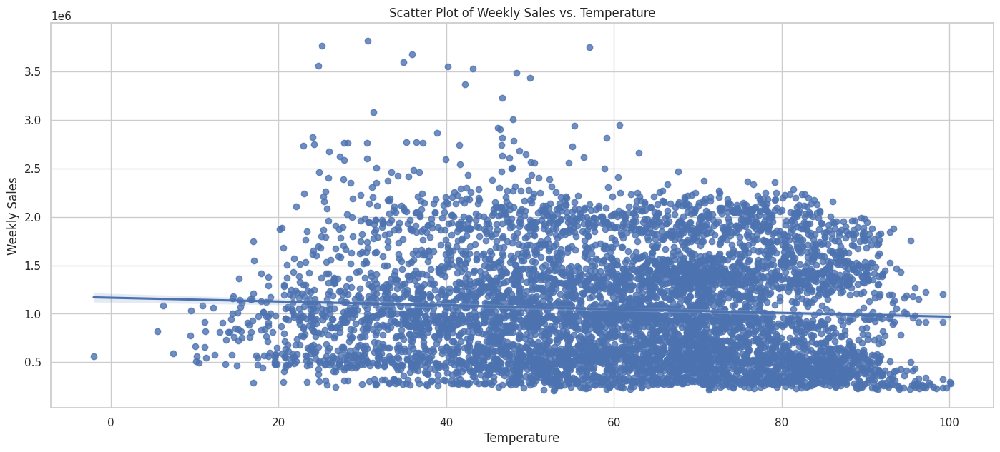

In [19]:
#checking how temperature affects the weekly sales

plt.figure(figsize=(17,7))
sns.regplot(x=df['temperature'],y=df['weekly_sales'])
plt.title("Scatter Plot of Weekly Sales vs. Temperature")
plt.xlabel("Temperature")
plt.ylabel("Weekly Sales")
plt.grid(True)

# Calculate the correlation between temperature and weekly sales
correlation = df['temperature'].corr(df['weekly_sales'])
print("Correlation between Temperature and Weekly Sales:", correlation)

We can see from the aforementioned graph that the weekly sales distribution is very stable for a temperature range of 40 to 80 F. However, the weekly sales are low if the temperature falls below 20 F or rises beyond 80 F.

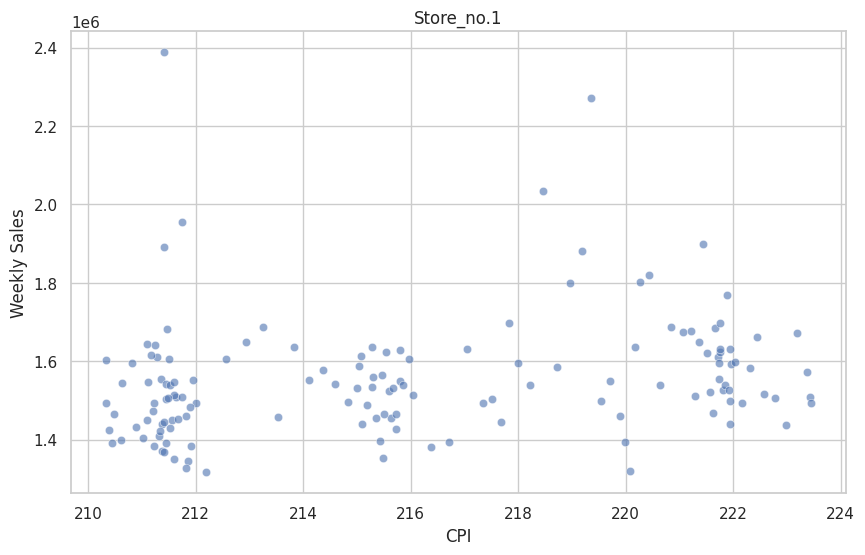

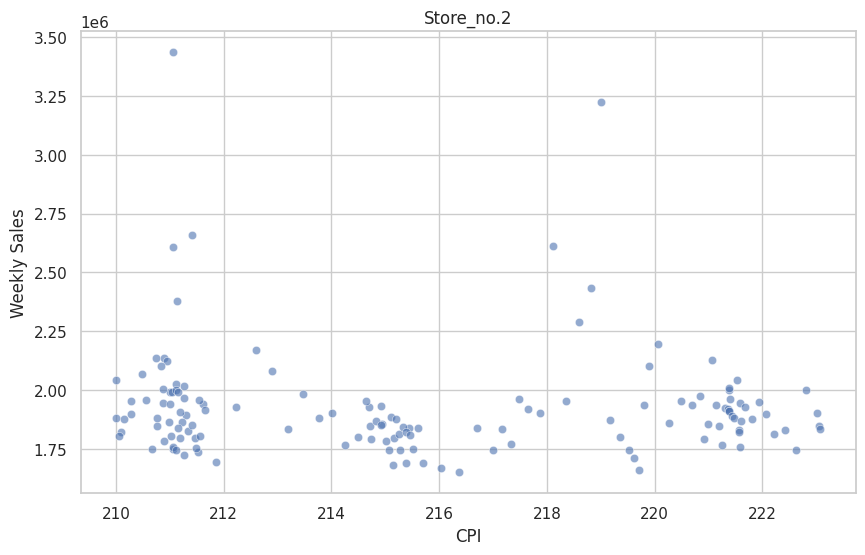

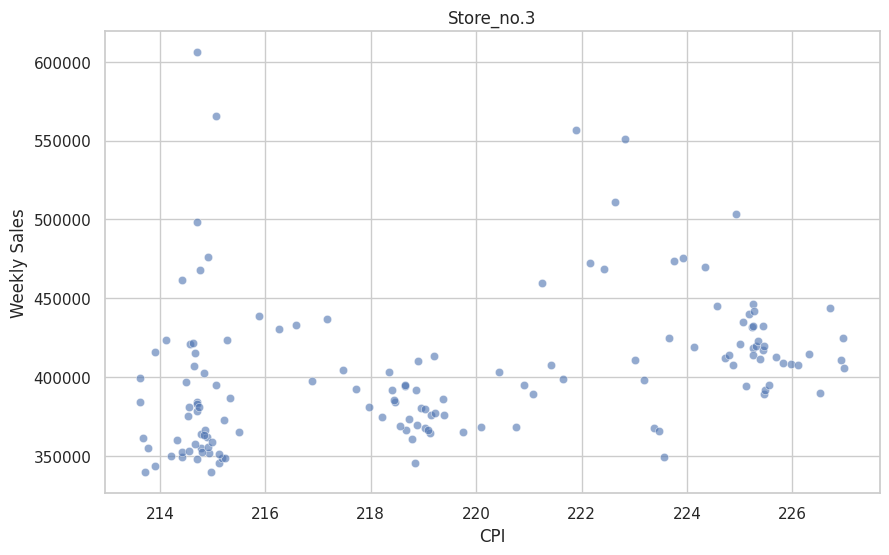

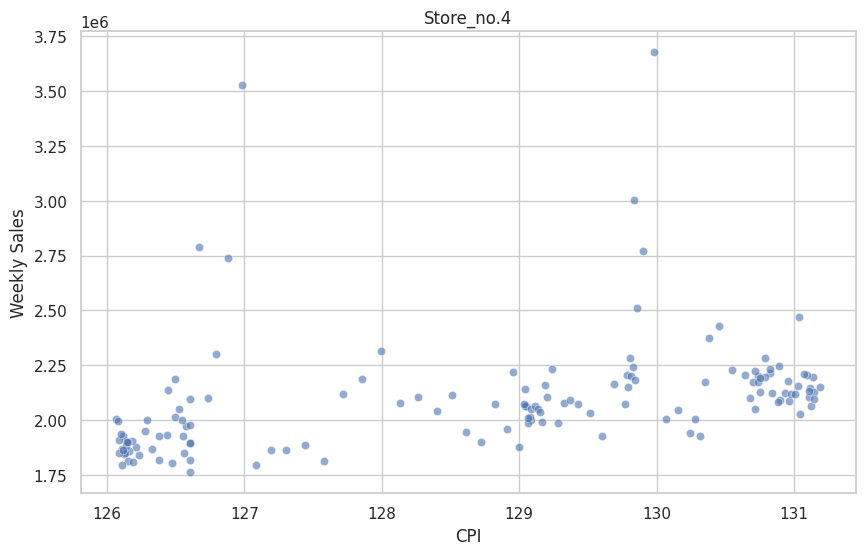

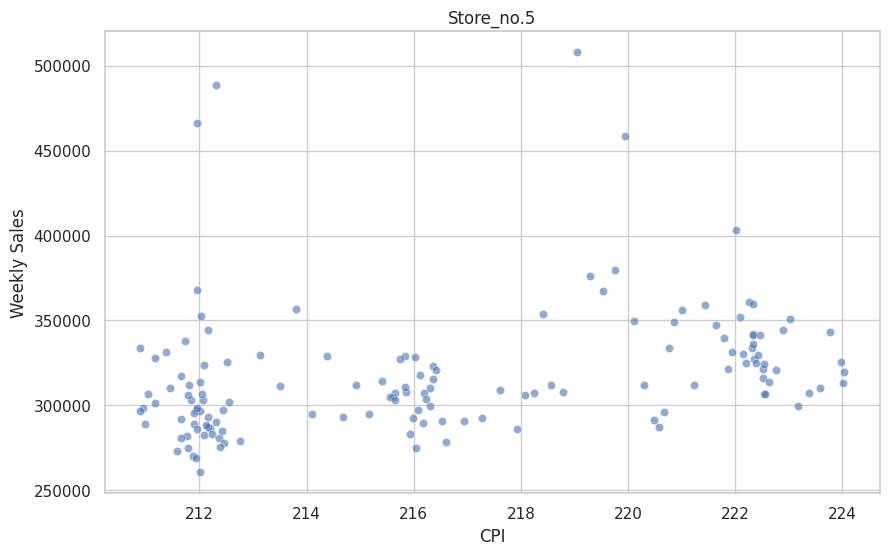

...

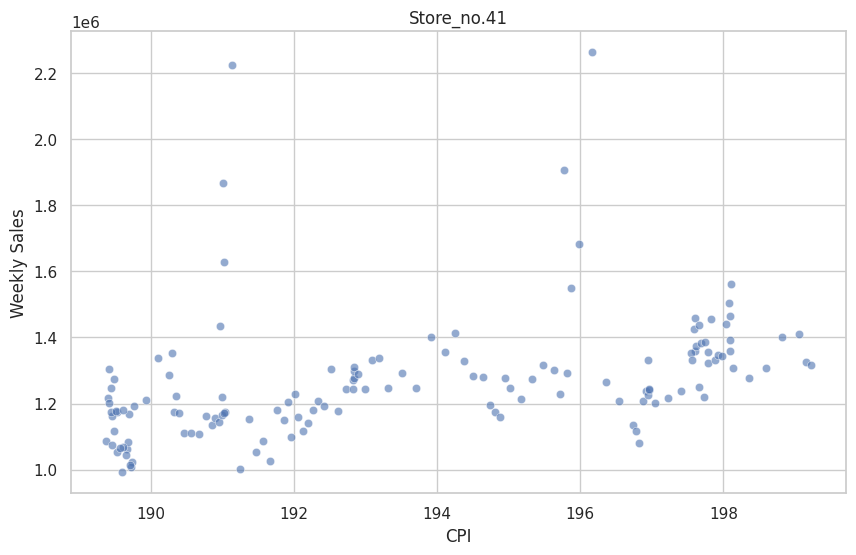

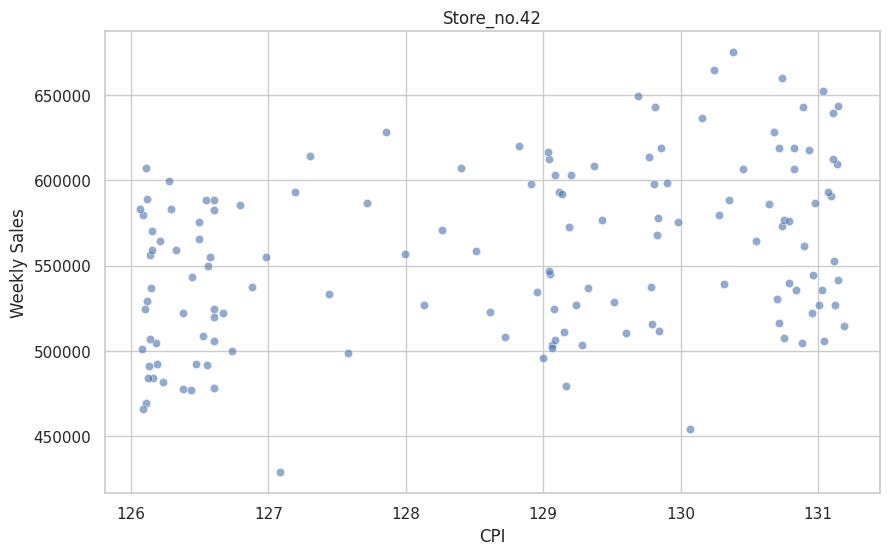

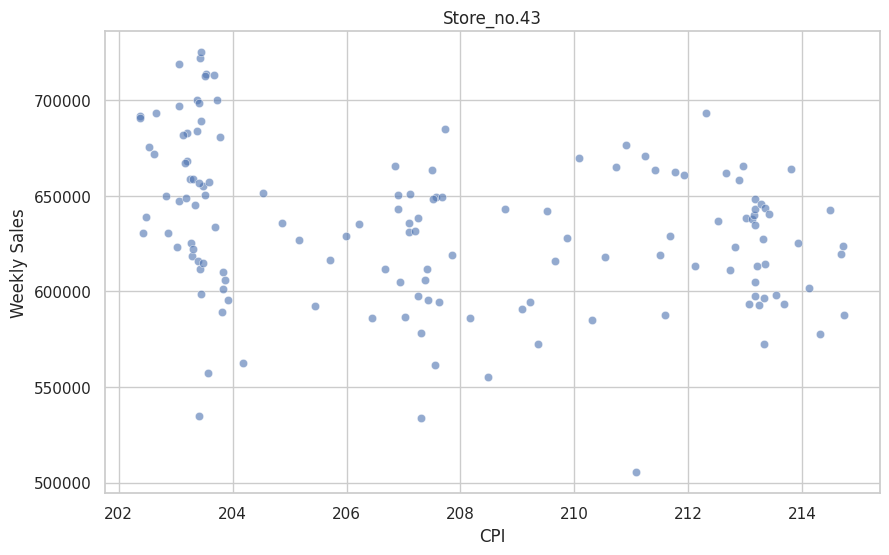

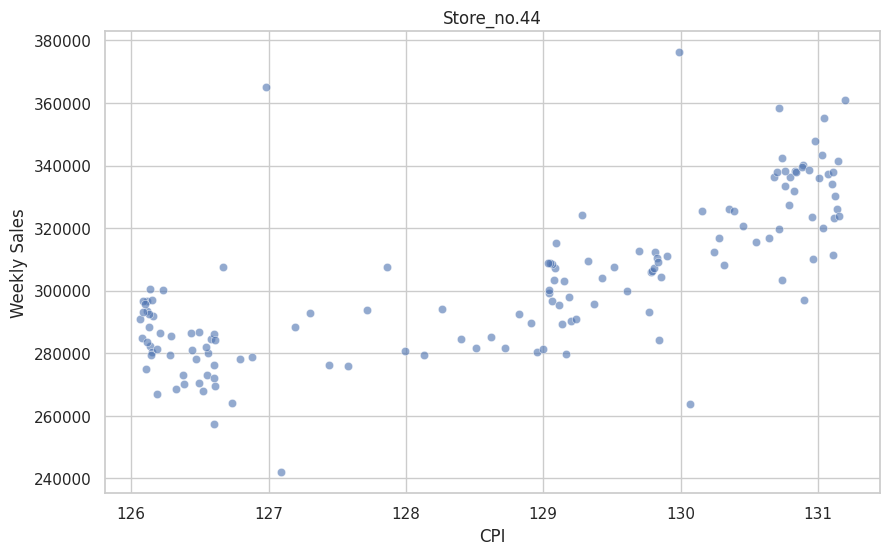

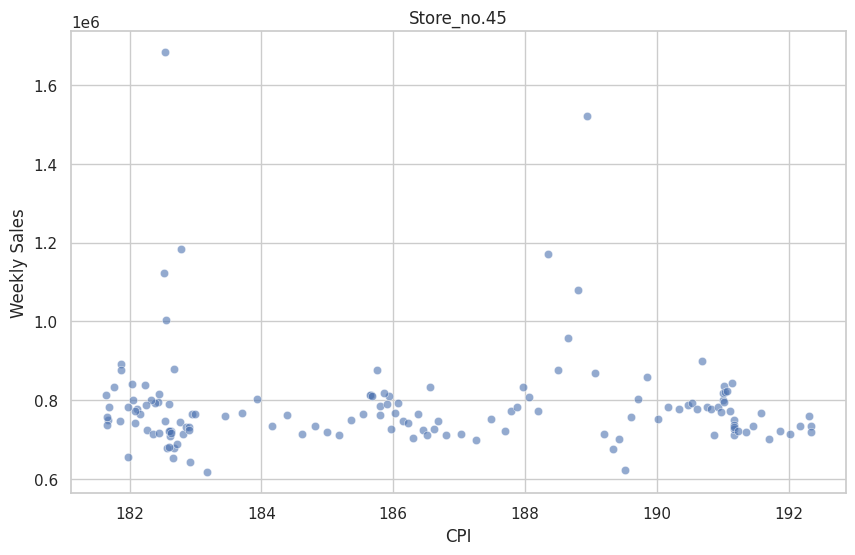

In [20]:
#checking the affect of CPI on sales of various store

for i in range(1, 46):
    # Filter data for the current store
    data = df[df['store'] == i]

    # Create a scatter plot for the current store
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=data['cpi'], y=data['weekly_sales'], alpha=0.6)
    plt.title(f'Store_no.{i}')
    plt.xlabel("CPI")
    plt.ylabel("Weekly Sales")
    plt.grid(True)
    plt.show()
    print()

In [21]:
#checking the distribution of data of the relevant columns

a= df.drop(columns=['store','weekly_sales','date','holiday_flag'])
a

,temperature,fuel_price,cpi,unemployment
0,42.31,2.572,211.096358,8.106
1,38.51,2.548,211.242170,8.106
2,39.93,2.514,211.289143,8.106
3,46.63,2.561,211.319643,8.106
4,46.50,2.625,211.350143,8.106
...,...,...,...,...
6430,64.88,3.997,192.013558,8.684
6431,64.89,3.985,192.170412,8.667
6432,54.47,4.000,192.327265,8.667
6433,56.47,3.969,192.330854,8.667


<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

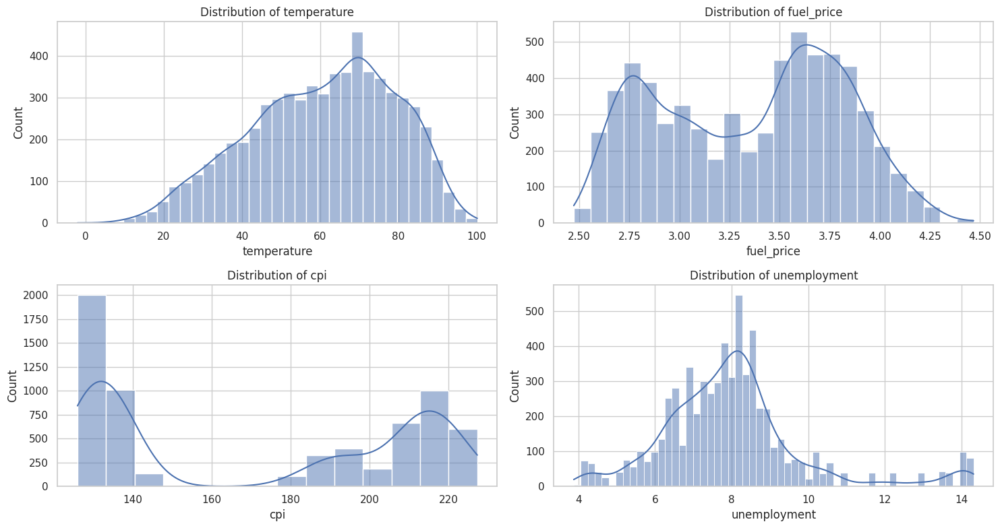

In [22]:
fig , axes = plt.subplots(2,2, figsize =(15,8))

for i , z in enumerate(axes.flatten()):
  if i<len(a.columns):
    sns.histplot(data=a, x=a.columns[i],kde= True , ax=z)
    z.set_title(f'Distribution of {a.columns[i]}')

plt.tight_layout()
plt.plot

In [23]:
#Checking the Sum of overall Weekly Sales for all the stores combined

df1= df[['date','weekly_sales']]
df1 = pd.DataFrame(df1.groupby('date')['weekly_sales'].sum().reset_index())
df1

,date,weekly_sales
0,01-04-2011,43458991.19
1,01-06-2012,48281649.72
2,01-07-2011,47578519.50
3,01-10-2010,42239875.87
4,02-03-2012,46861034.97
...,...,...
138,30-07-2010,44630363.42
139,30-09-2011,42195830.81
140,30-12-2011,46042461.04
141,31-08-2012,47159639.43


In [24]:
df_new = df1.copy()
df_new.columns = ['date', 'weekly_sales']
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143 entries, 0 to 142
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          143 non-null    object 
 1   weekly_sales  143 non-null    float64
dtypes: float64(1), object(1)
memory usage: 2.4+ KB


In [25]:
df_new['date'] = pd.to_datetime(df_new['date'], dayfirst = True)


Seasonal Decomposition for all Stores Combined


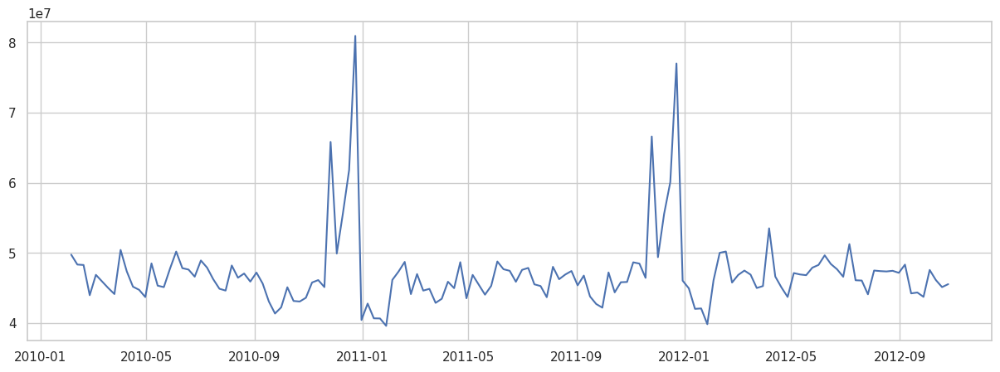

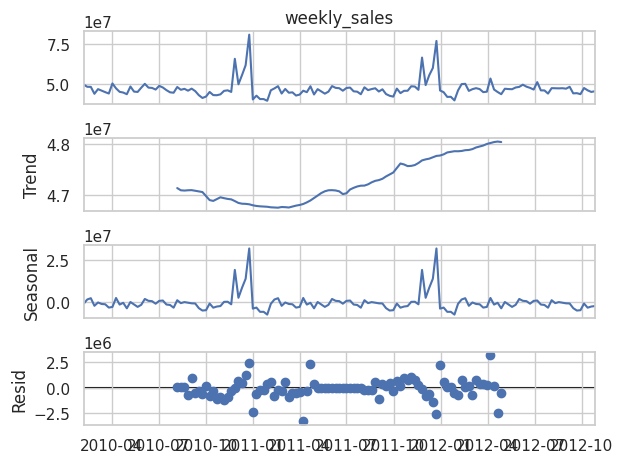

In [26]:
#plotting the graph for the overall sales
df_new= df_new.sort_values(by='date')
plt.figure(figsize = (15,5))
plt.plot(df_new['date'],df_new['weekly_sales'] )
plt.plot()
print()

#plotting the seasonality of overall sales for all stores
from statsmodels.tsa.seasonal import seasonal_decompose

print('Seasonal Decomposition for all Stores Combined')
df1['date']=pd.to_datetime(df1['date'],dayfirst=True)
df1= df1.sort_values(by='date')
df1= df1.set_index(['date'])

store_seasonality = seasonal_decompose(df1['weekly_sales'].dropna())
store_seasonality.plot();
plt.show()





Seasonal Decomposition for Overall Sales Per Week for Store Number 1


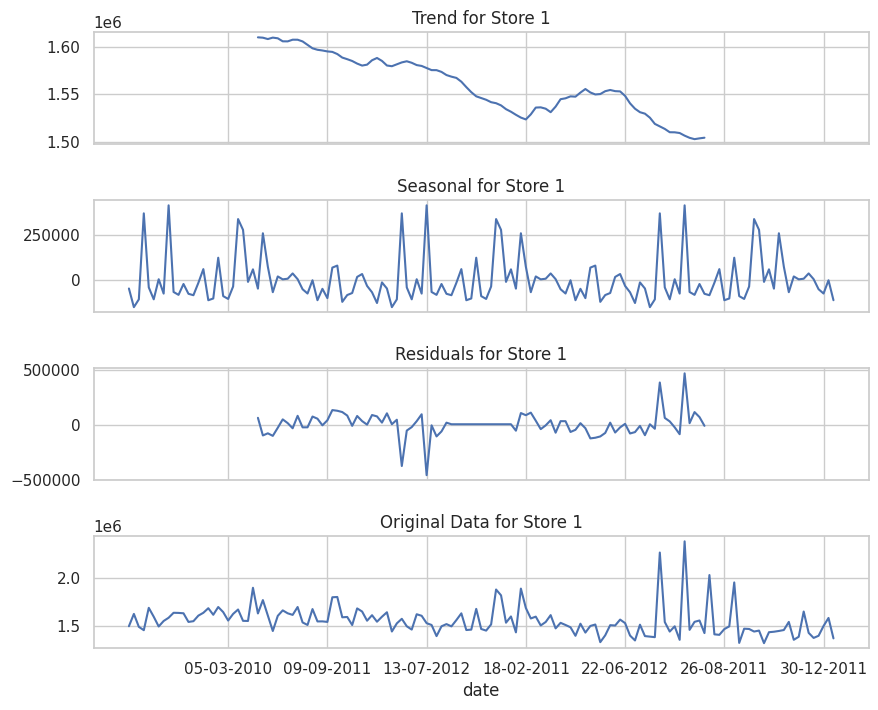



Seasonal Decomposition for Overall Sales Per Week for Store Number 2


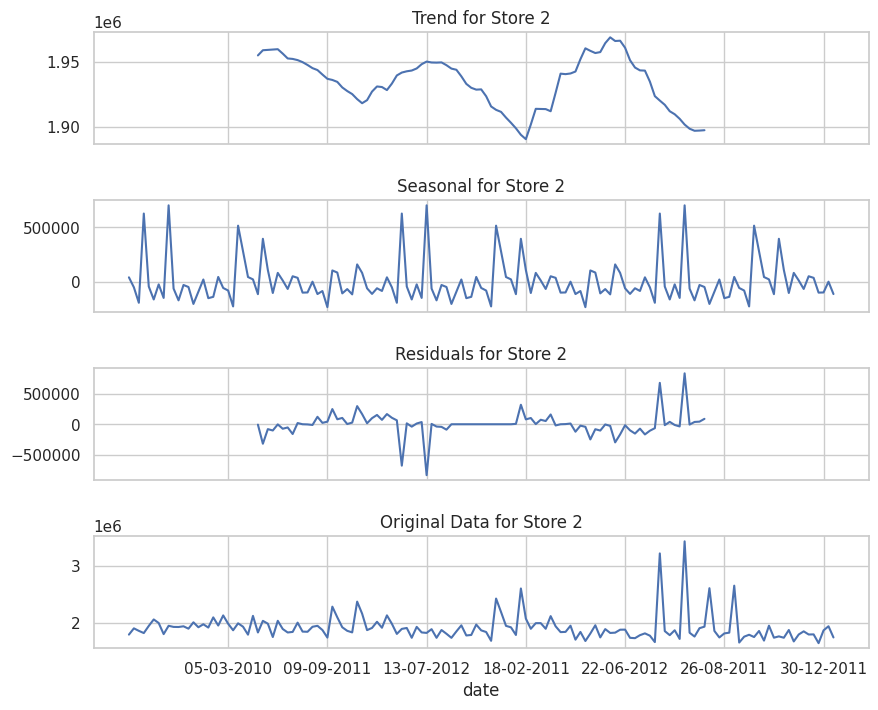



Seasonal Decomposition for Overall Sales Per Week for Store Number 3


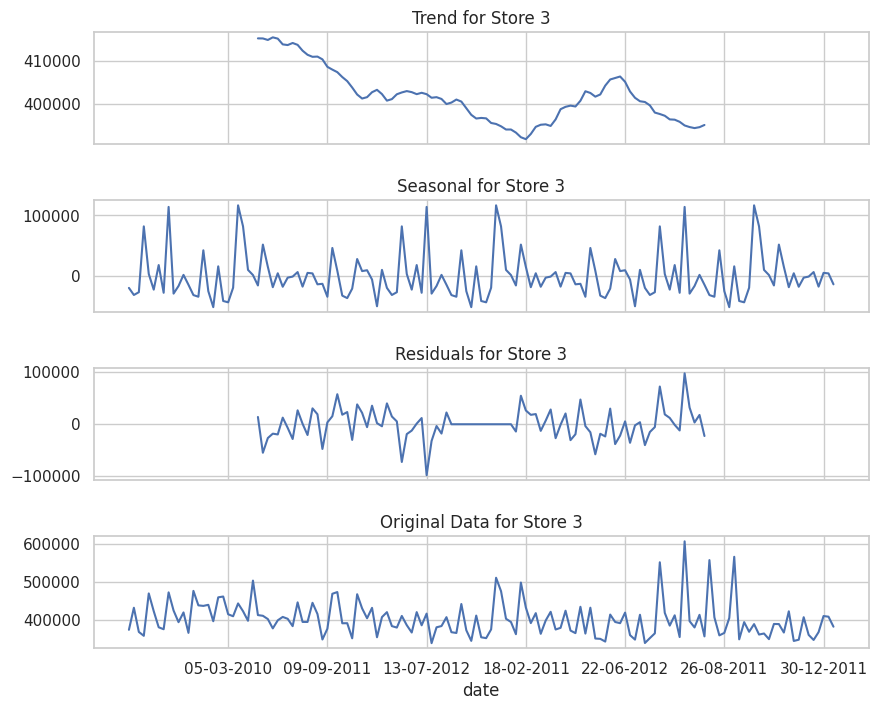



Seasonal Decomposition for Overall Sales Per Week for Store Number 4


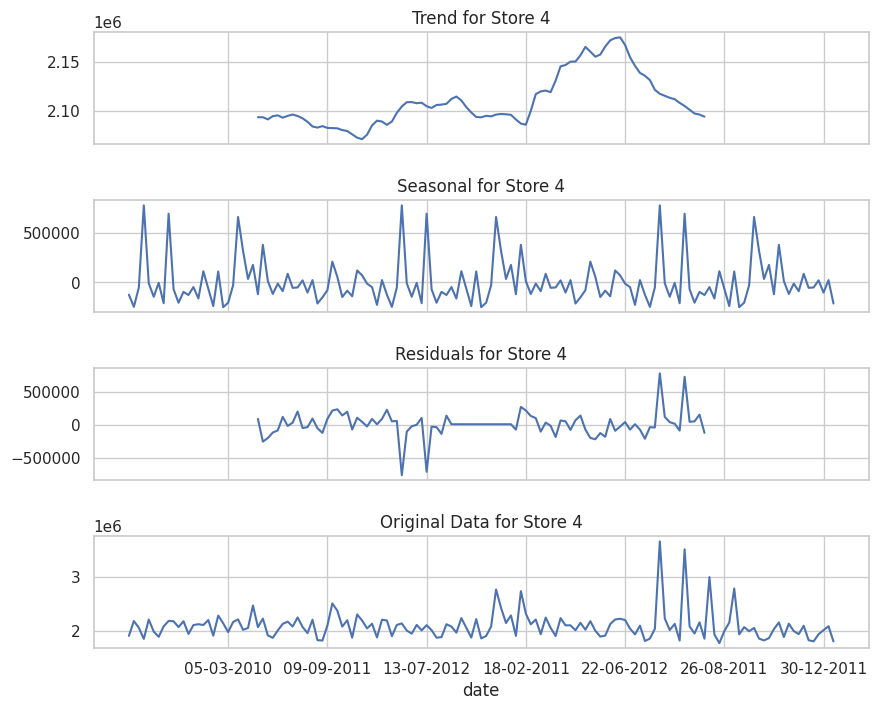



Seasonal Decomposition for Overall Sales Per Week for Store Number 5


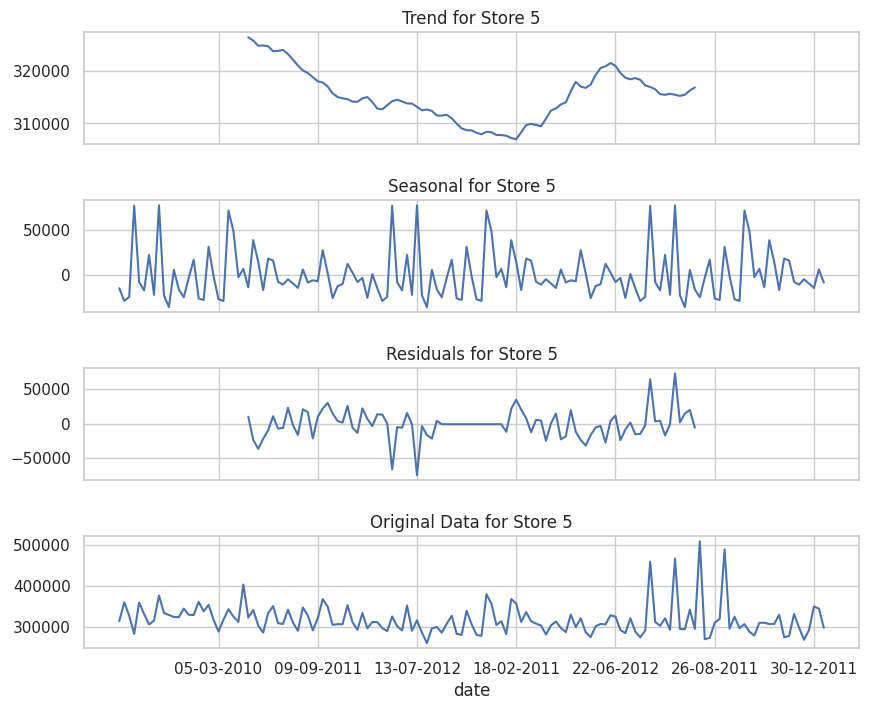



Seasonal Decomposition for Overall Sales Per Week for Store Number 6


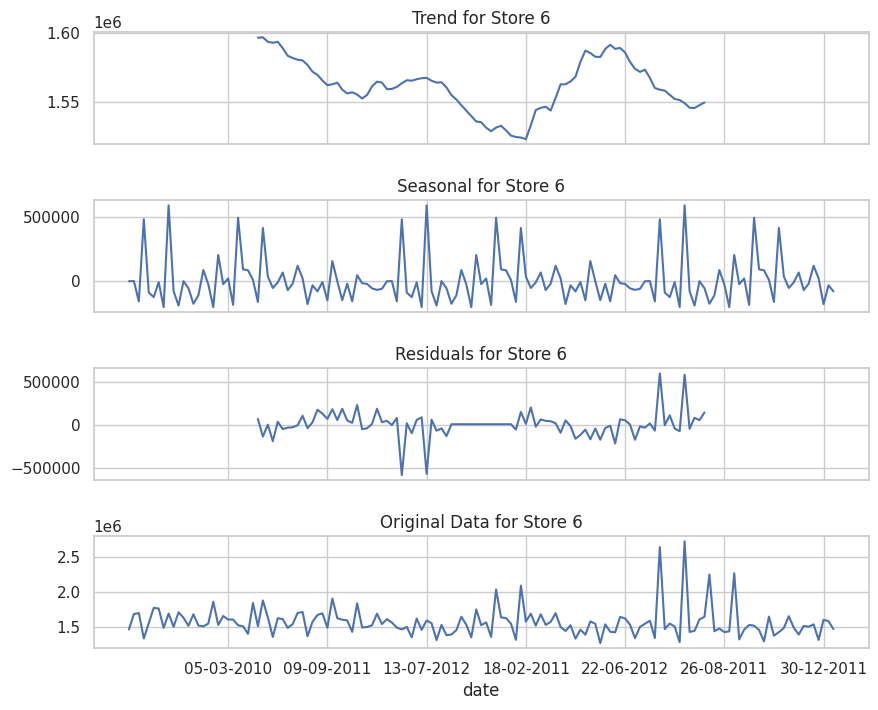



Seasonal Decomposition for Overall Sales Per Week for Store Number 7


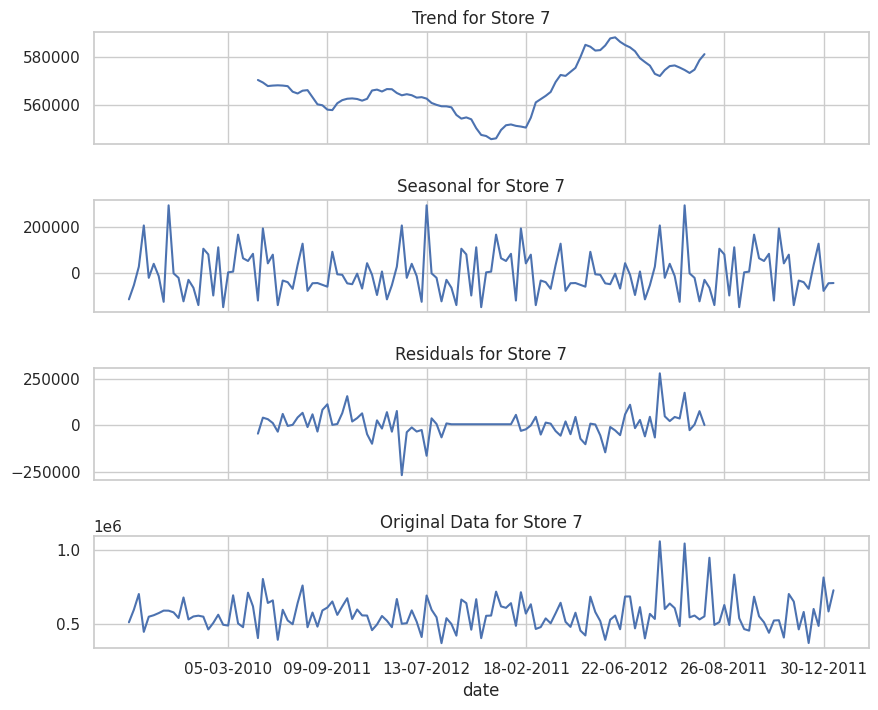



Seasonal Decomposition for Overall Sales Per Week for Store Number 8


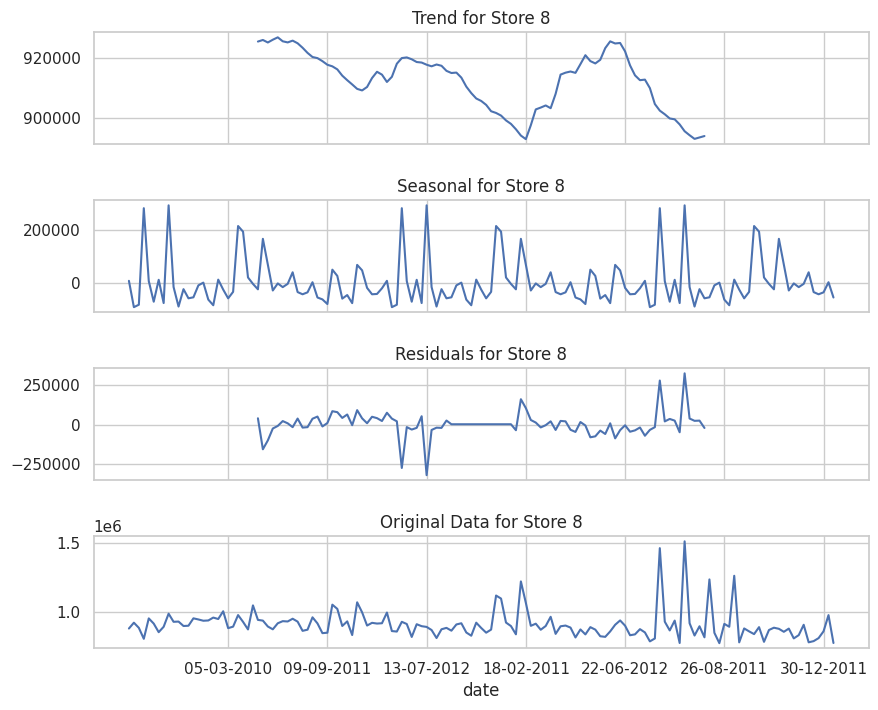



Seasonal Decomposition for Overall Sales Per Week for Store Number 9


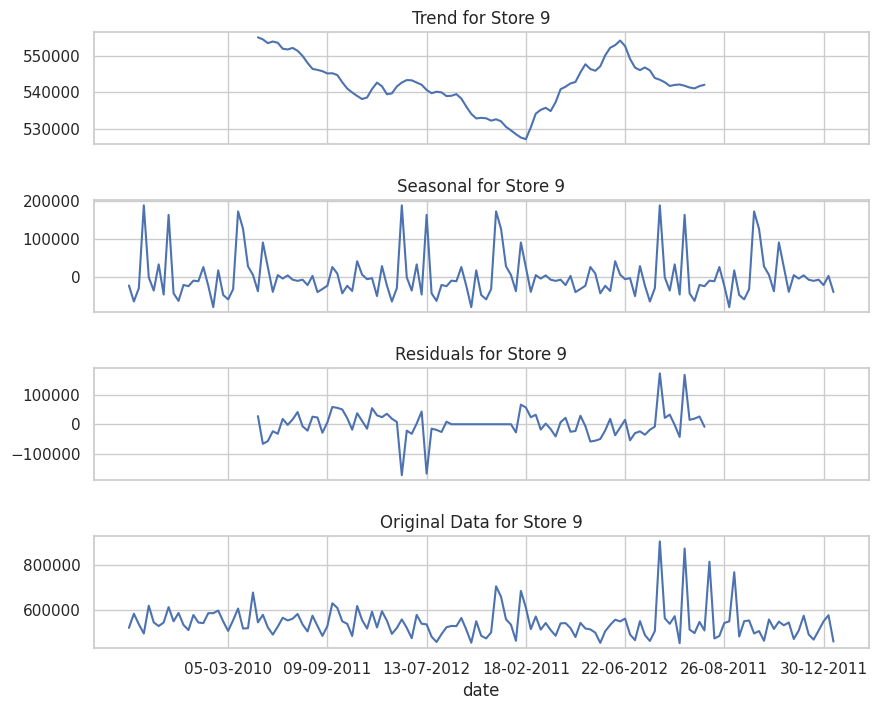



Seasonal Decomposition for Overall Sales Per Week for Store Number 10


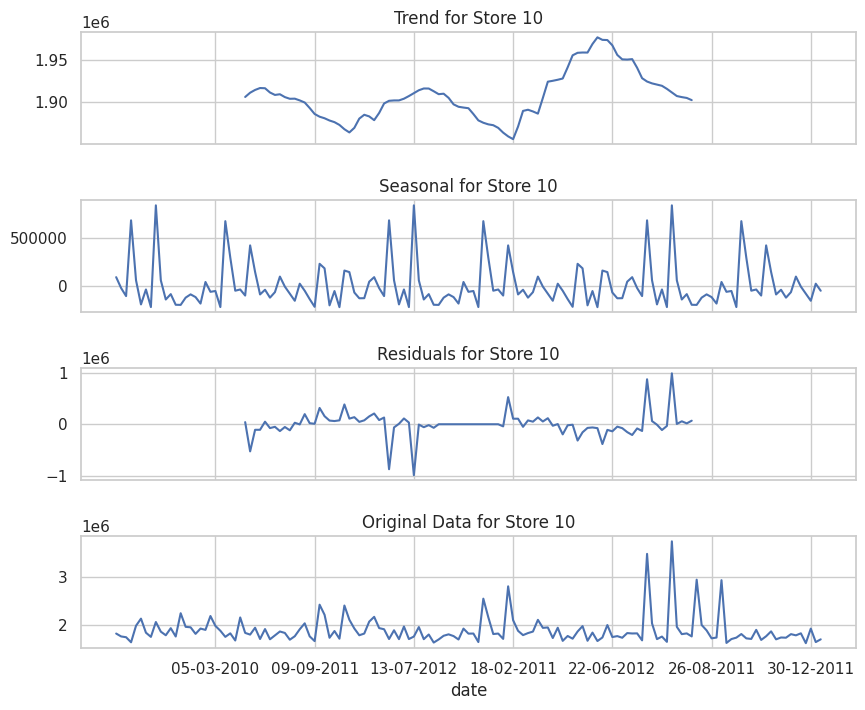



Seasonal Decomposition for Overall Sales Per Week for Store Number 11


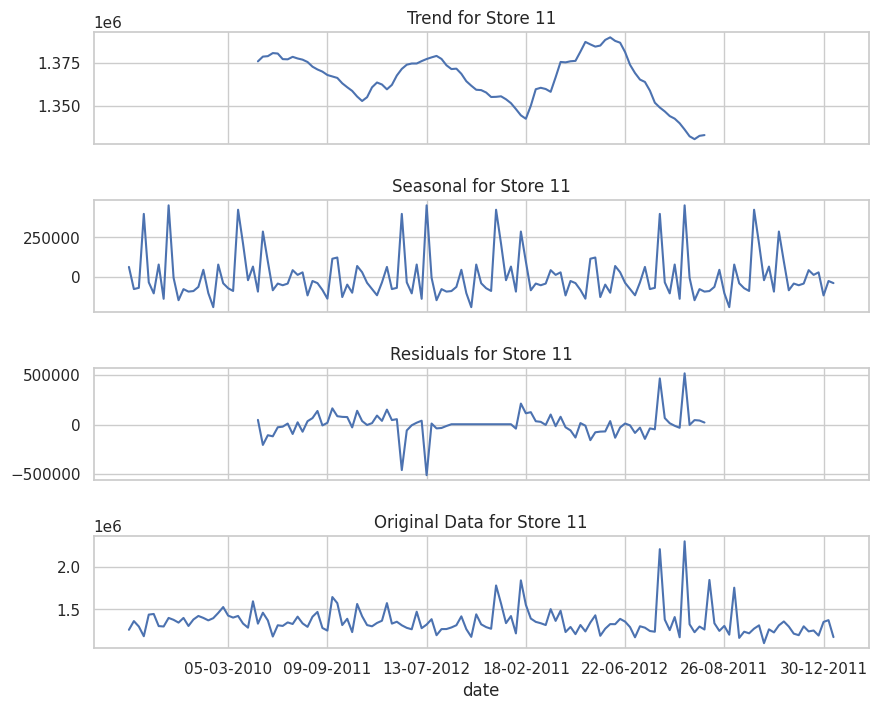



Seasonal Decomposition for Overall Sales Per Week for Store Number 12


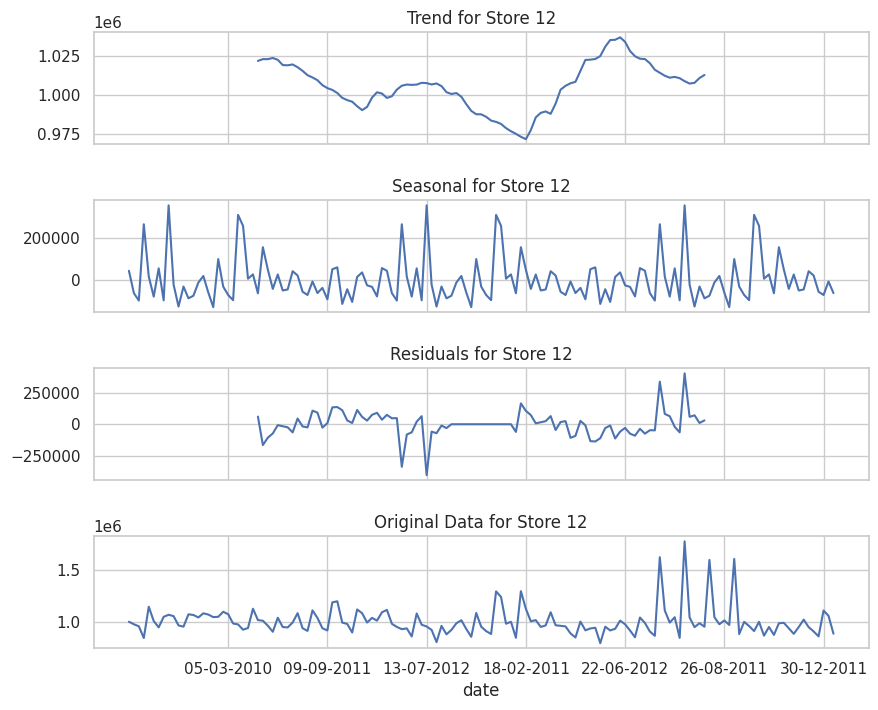



Seasonal Decomposition for Overall Sales Per Week for Store Number 13


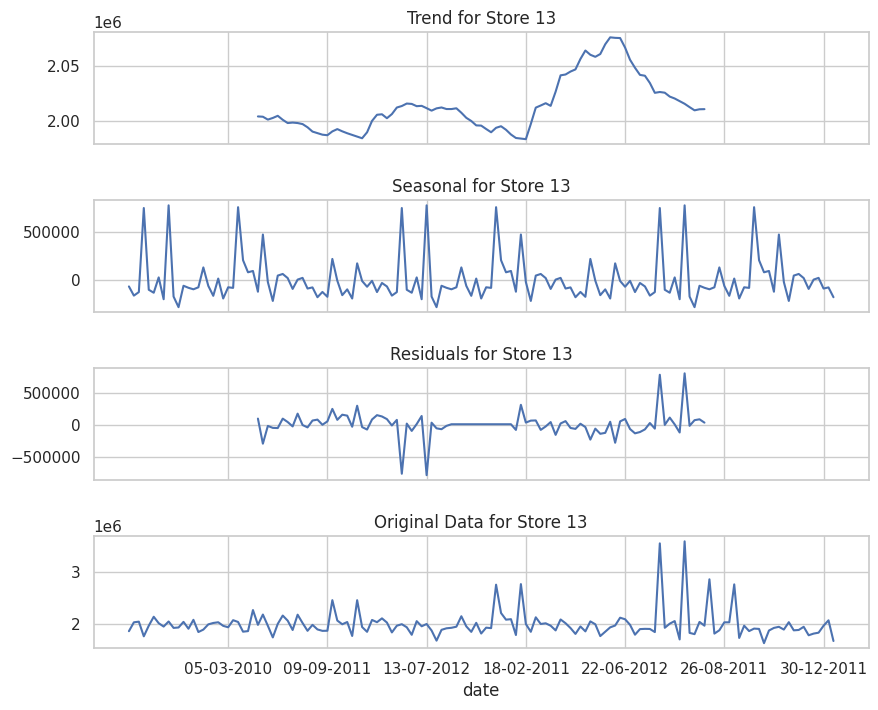



Seasonal Decomposition for Overall Sales Per Week for Store Number 14


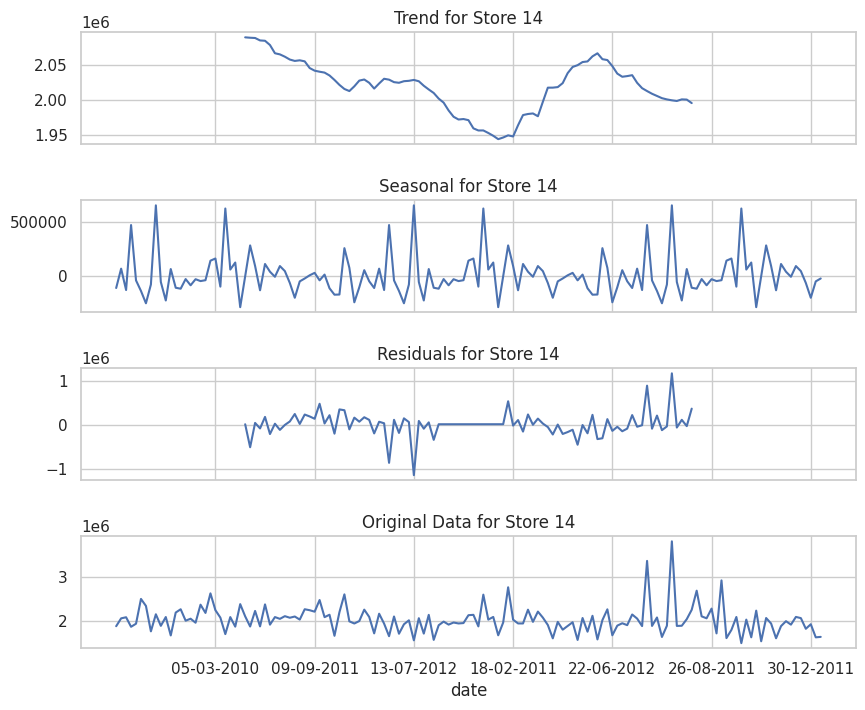



Seasonal Decomposition for Overall Sales Per Week for Store Number 15


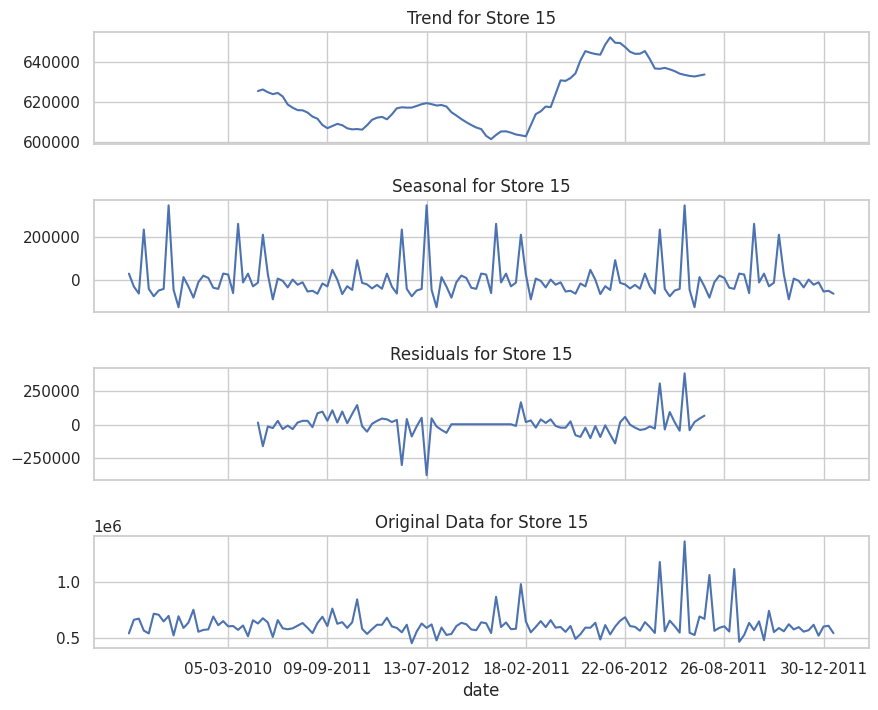



Seasonal Decomposition for Overall Sales Per Week for Store Number 16


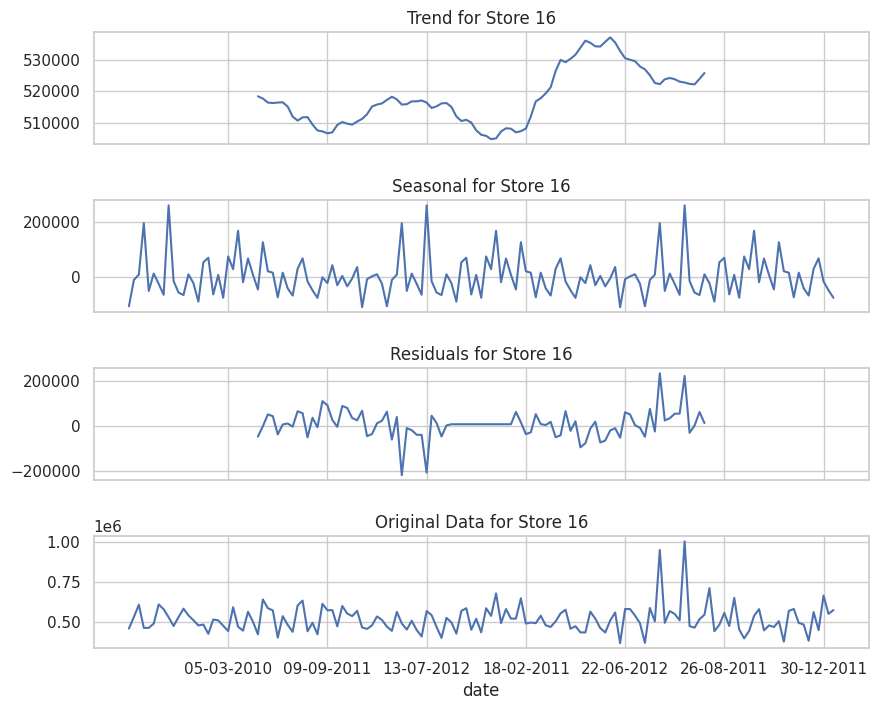



Seasonal Decomposition for Overall Sales Per Week for Store Number 17


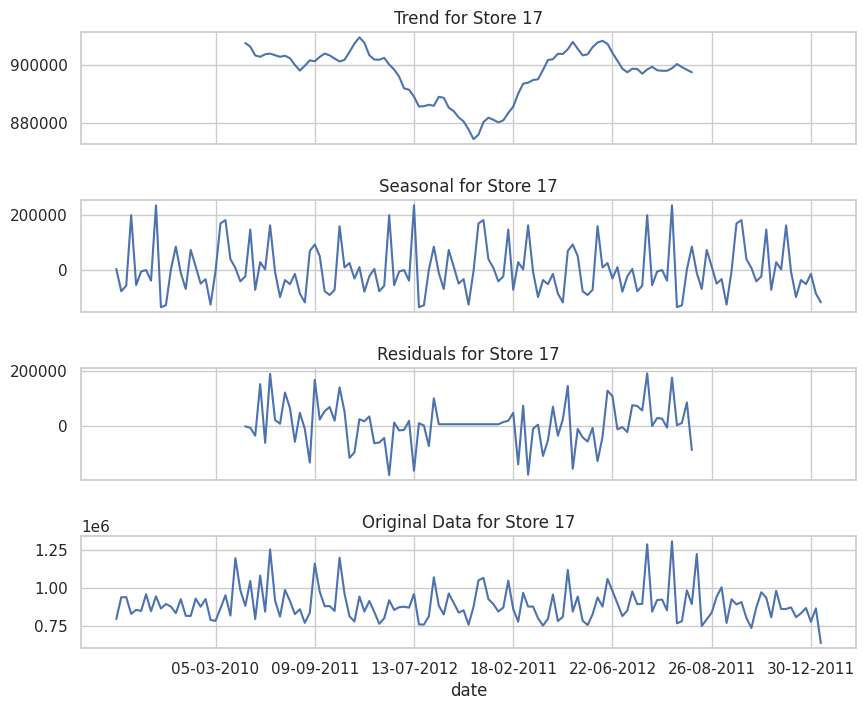



Seasonal Decomposition for Overall Sales Per Week for Store Number 18


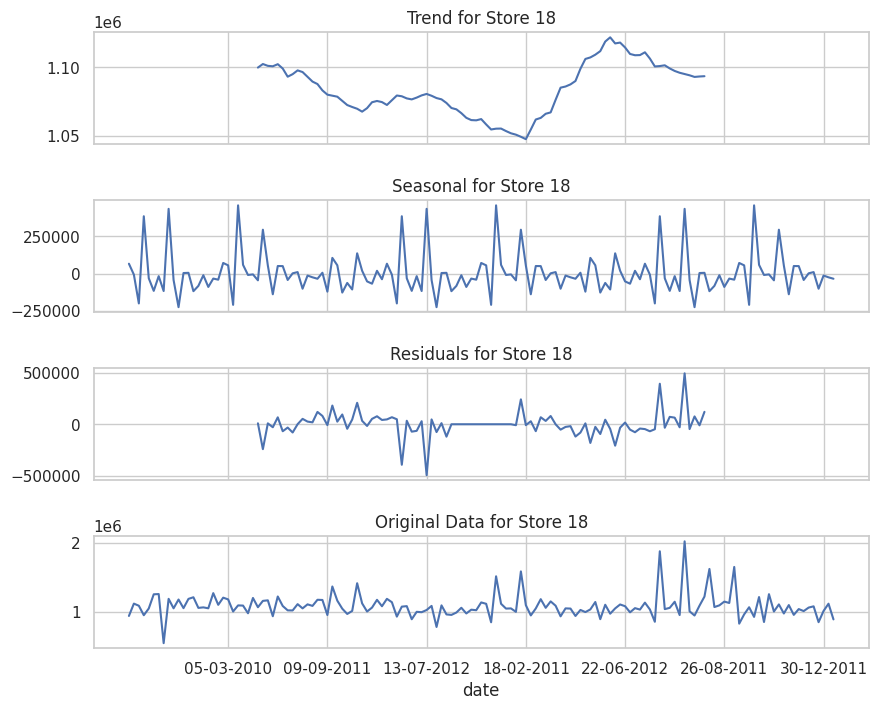



Seasonal Decomposition for Overall Sales Per Week for Store Number 19


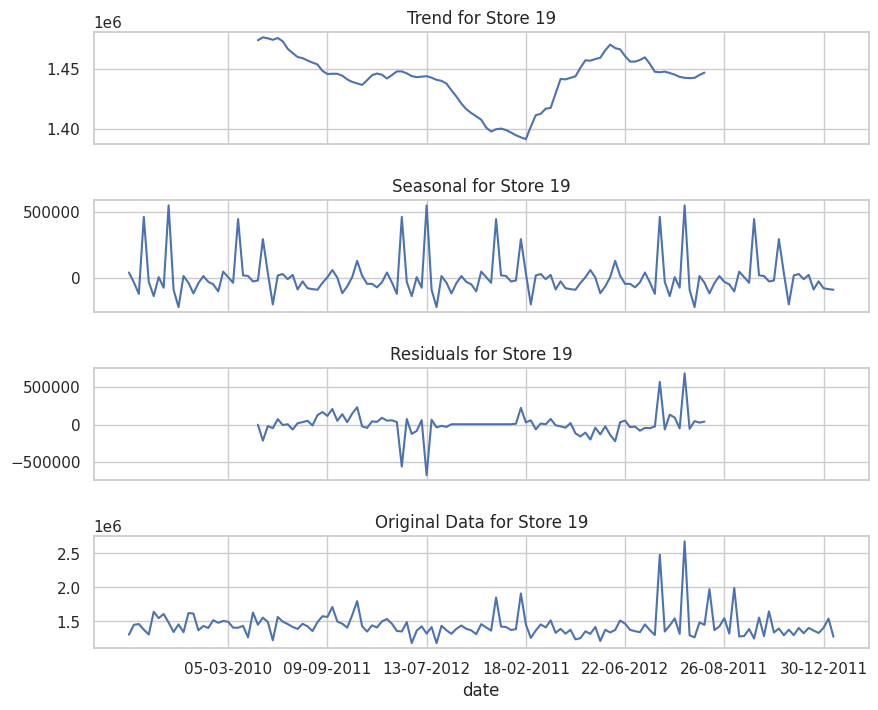



Seasonal Decomposition for Overall Sales Per Week for Store Number 20


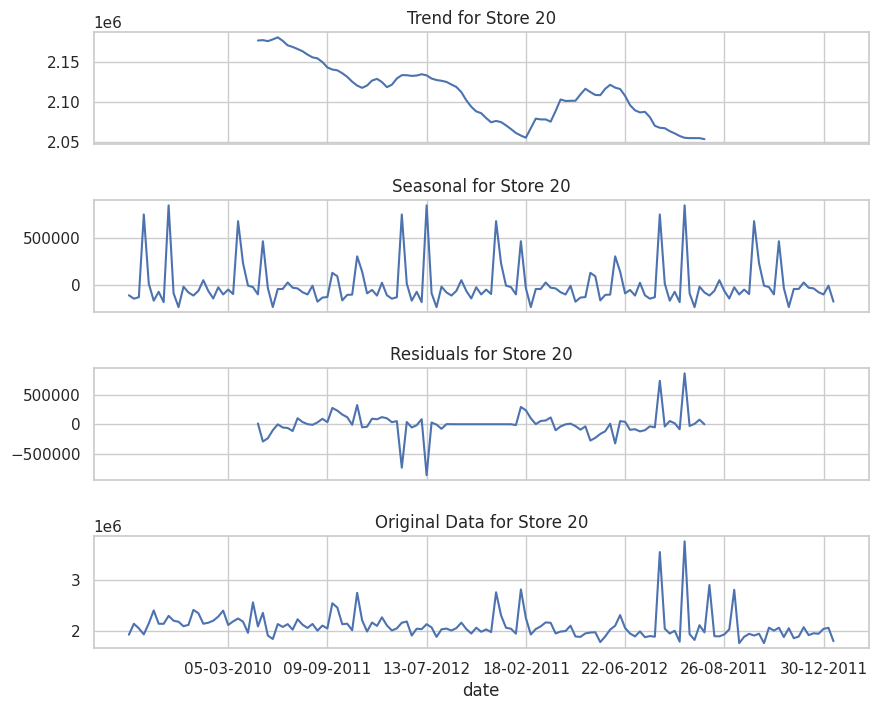



Seasonal Decomposition for Overall Sales Per Week for Store Number 21


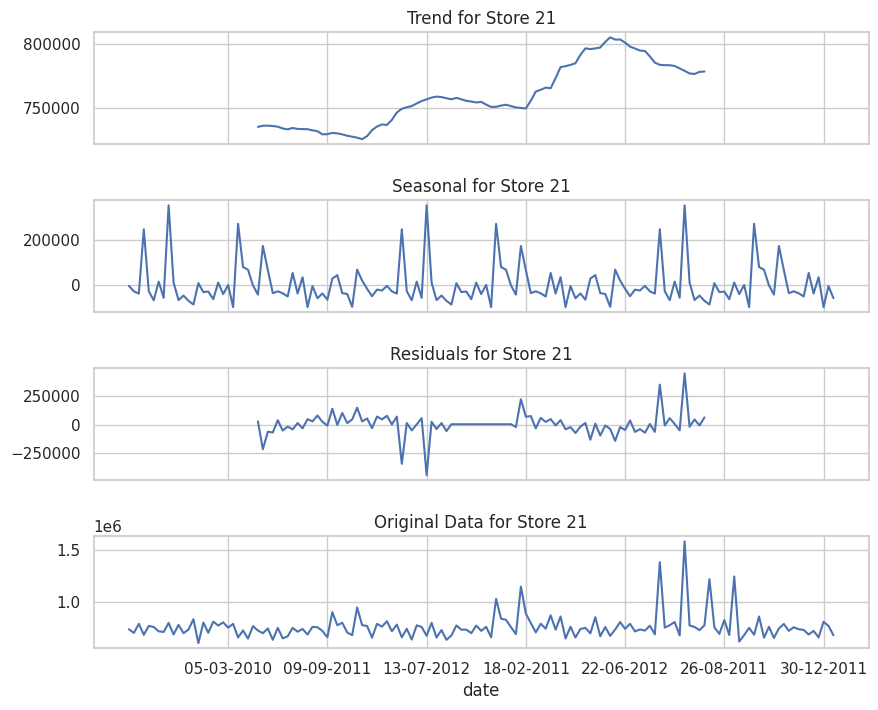



Seasonal Decomposition for Overall Sales Per Week for Store Number 22


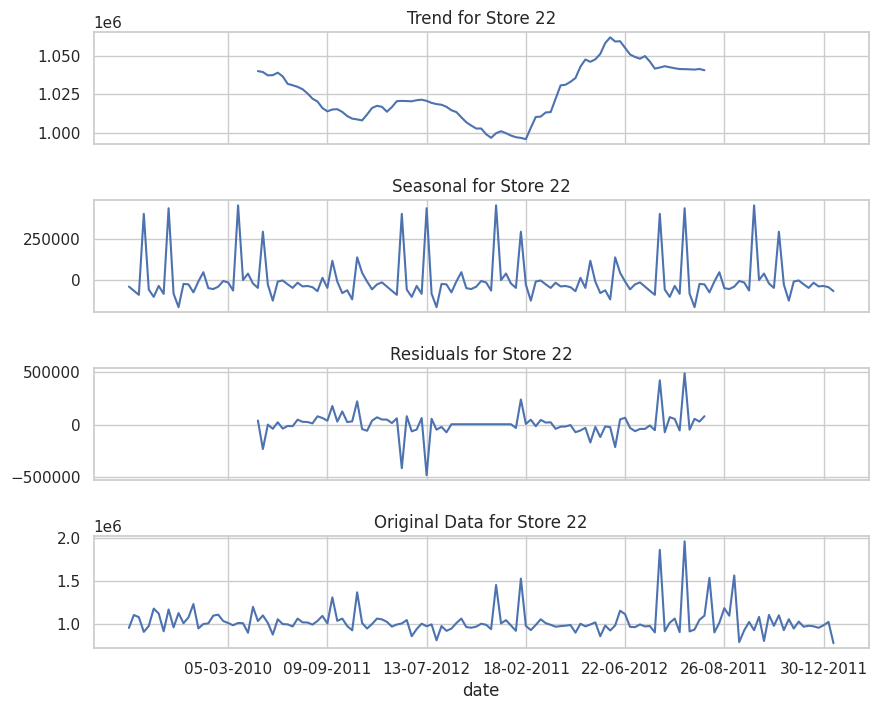



Seasonal Decomposition for Overall Sales Per Week for Store Number 23


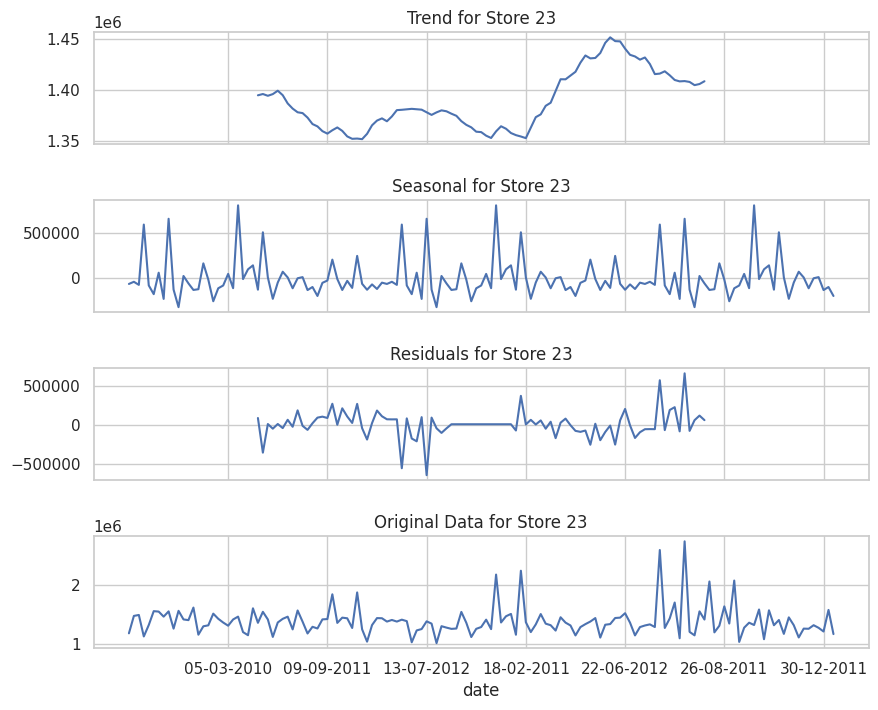



Seasonal Decomposition for Overall Sales Per Week for Store Number 24


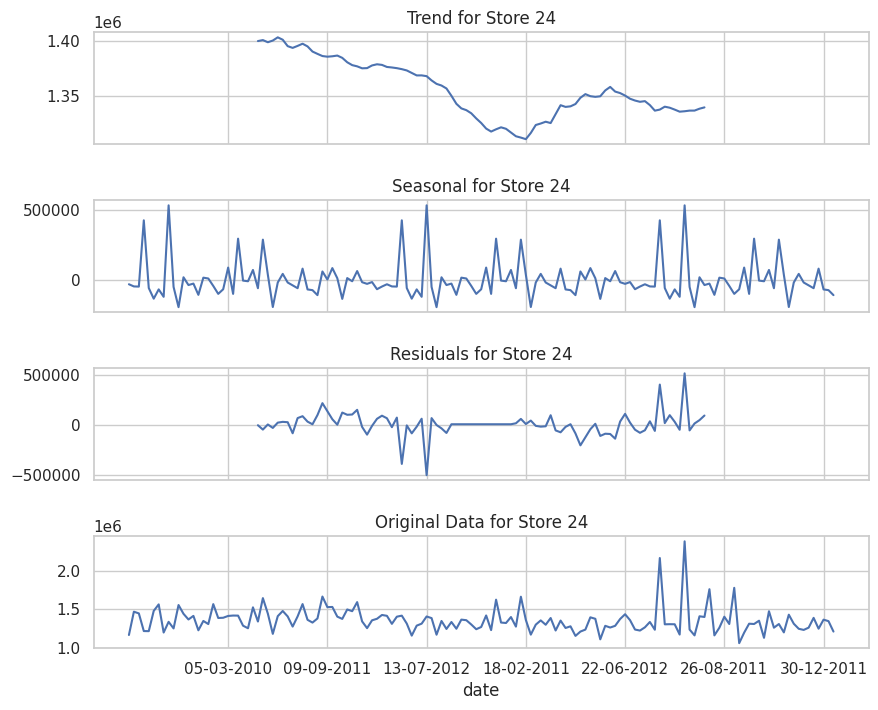



Seasonal Decomposition for Overall Sales Per Week for Store Number 25


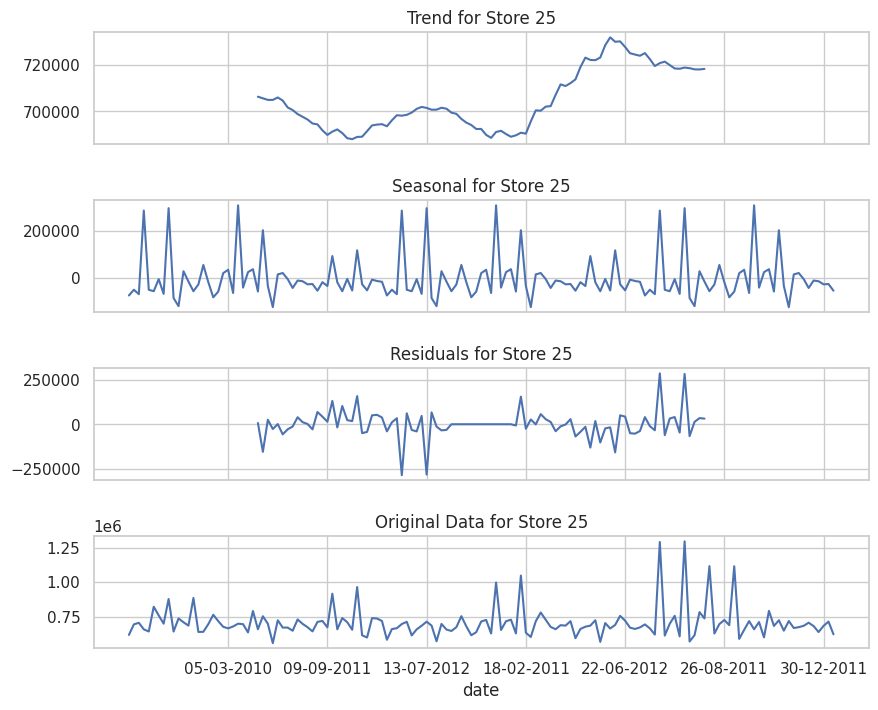



Seasonal Decomposition for Overall Sales Per Week for Store Number 26


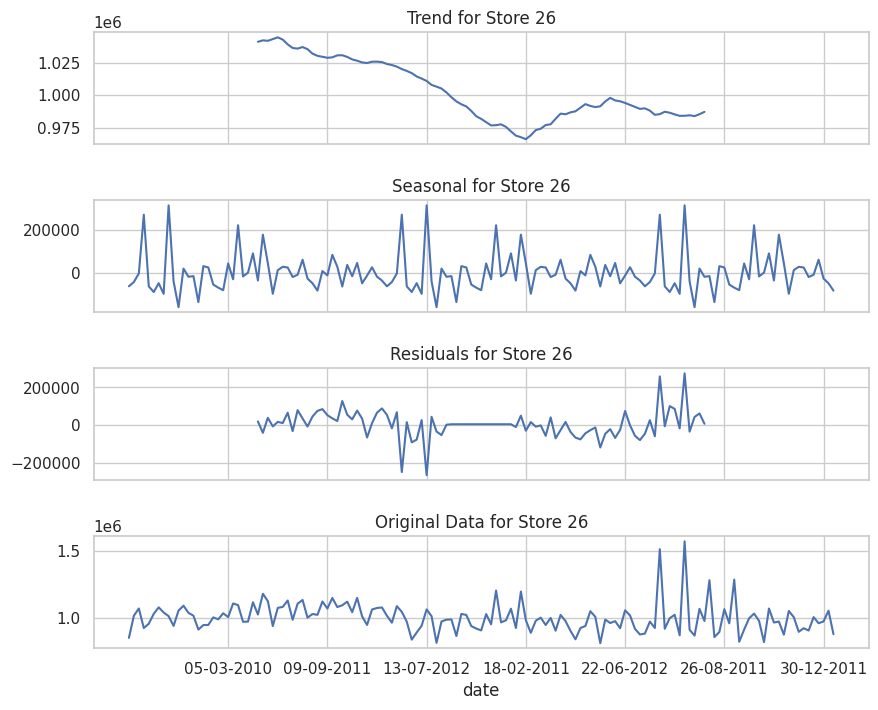



Seasonal Decomposition for Overall Sales Per Week for Store Number 27


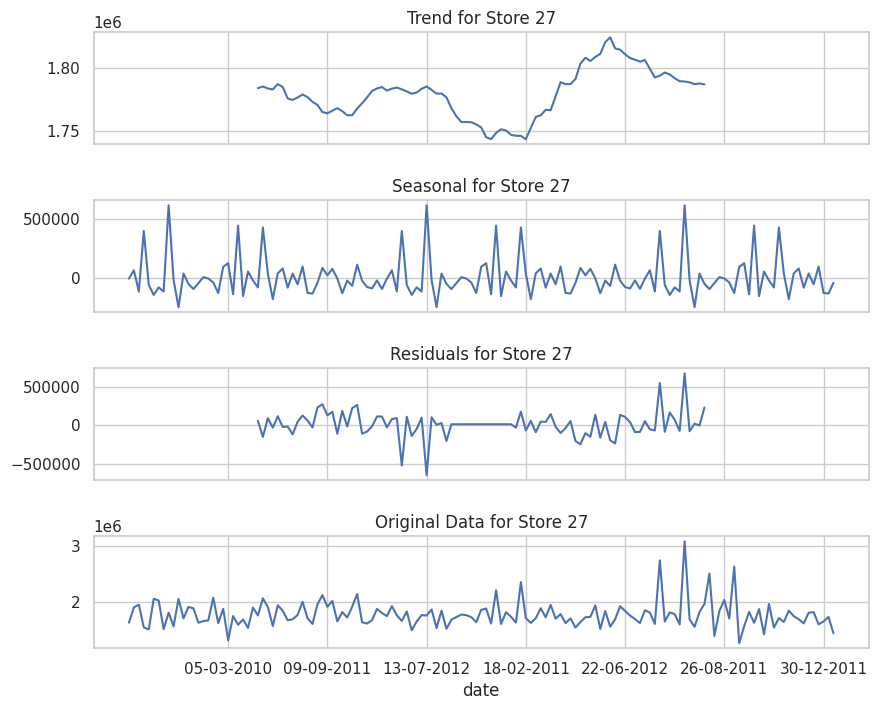



Seasonal Decomposition for Overall Sales Per Week for Store Number 28


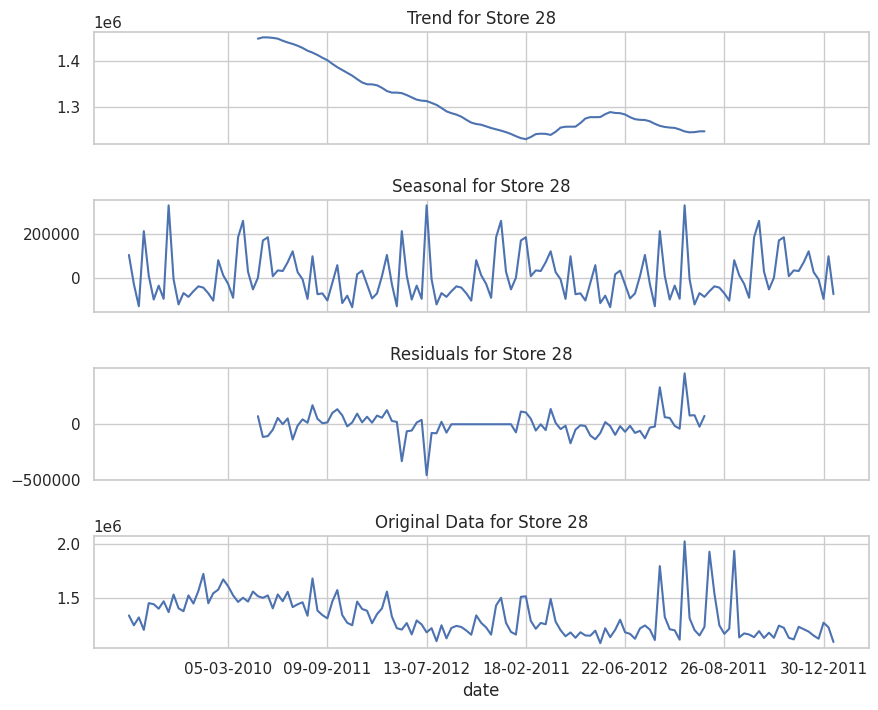



Seasonal Decomposition for Overall Sales Per Week for Store Number 29


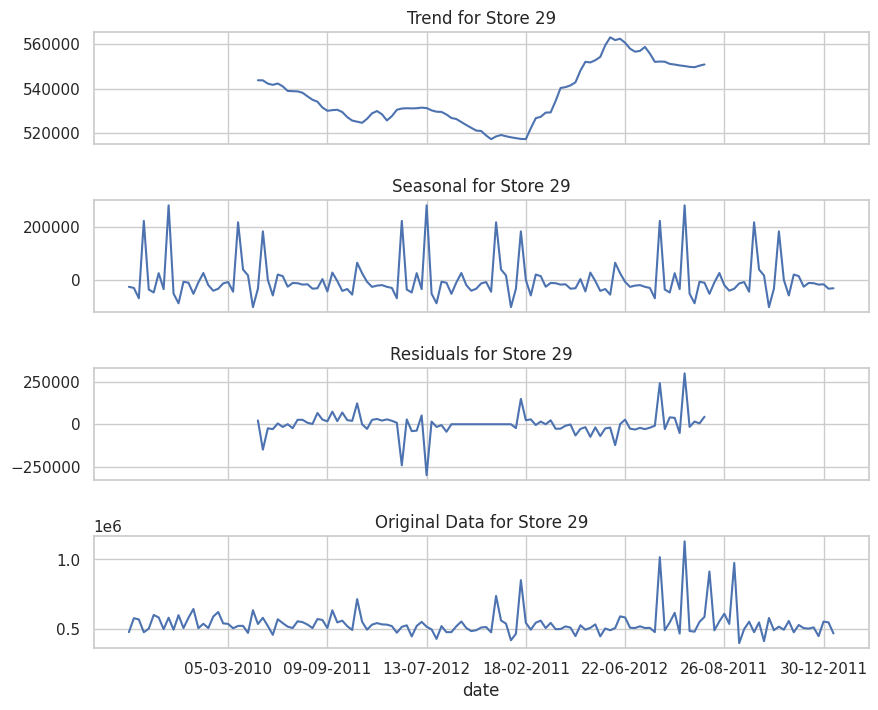



Seasonal Decomposition for Overall Sales Per Week for Store Number 30


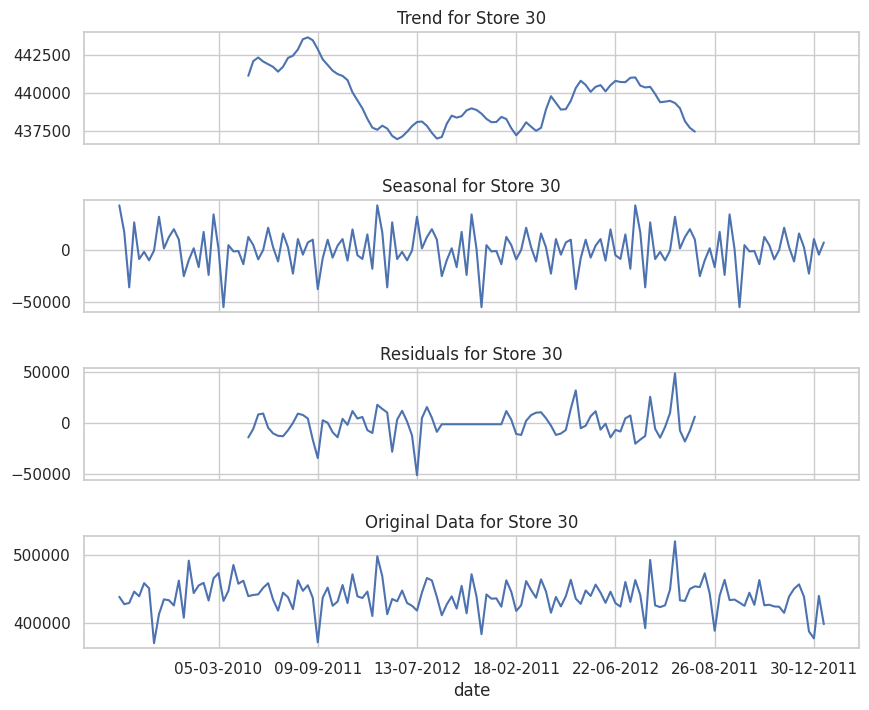



Seasonal Decomposition for Overall Sales Per Week for Store Number 31


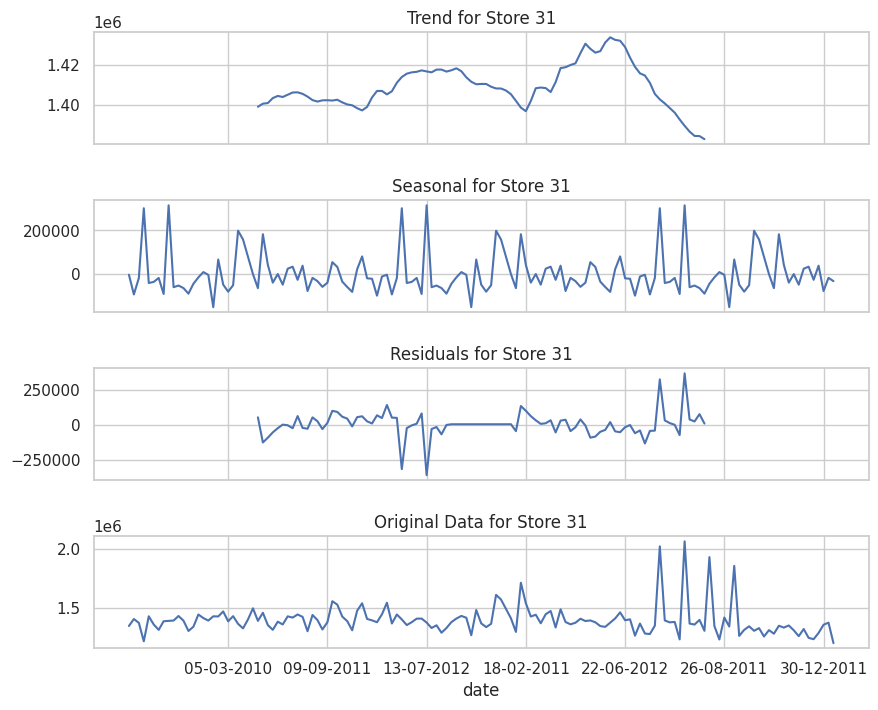



Seasonal Decomposition for Overall Sales Per Week for Store Number 32


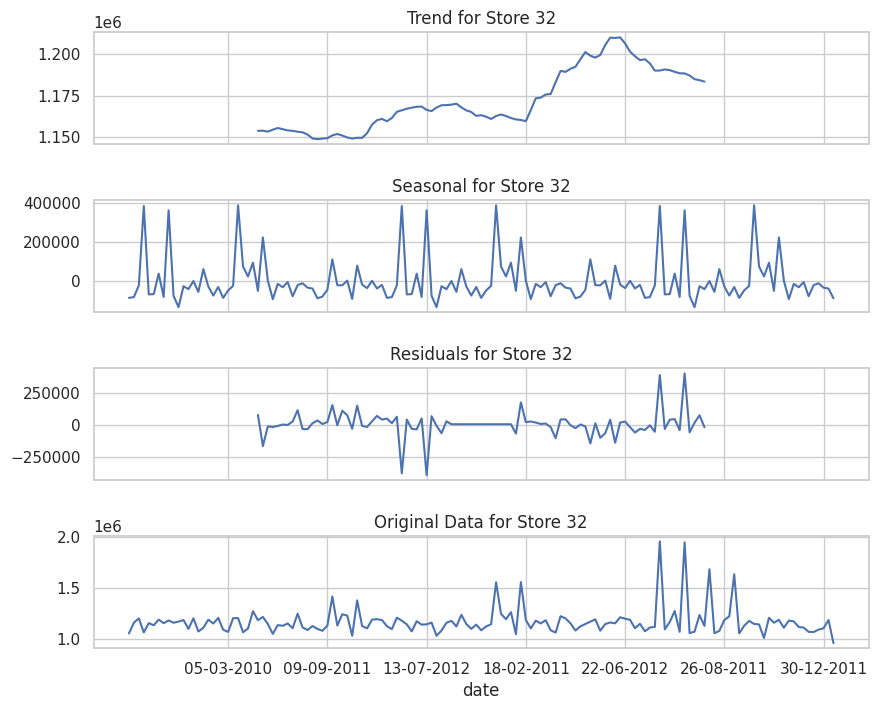



Seasonal Decomposition for Overall Sales Per Week for Store Number 33


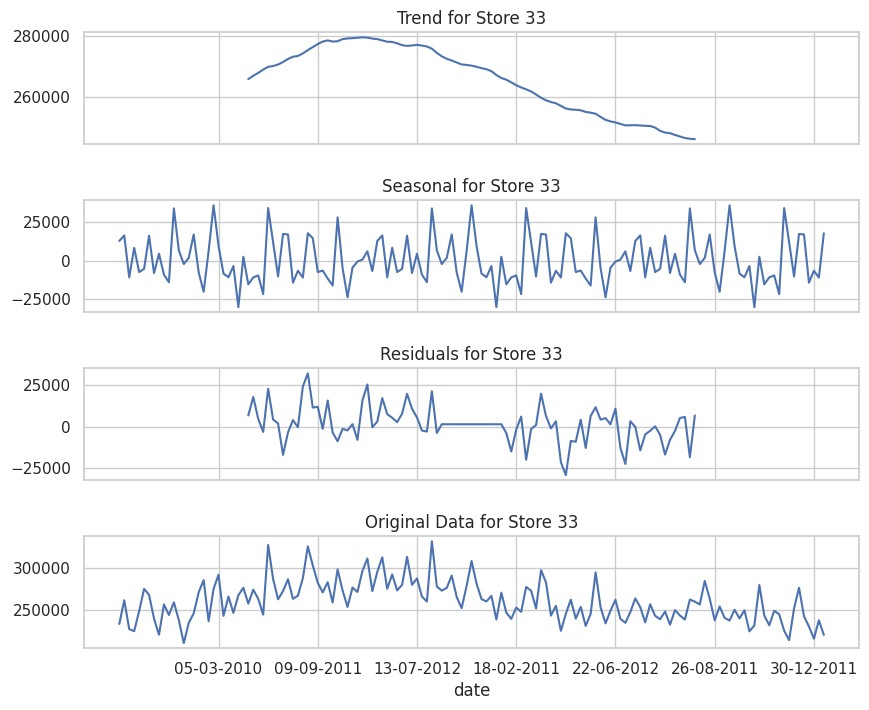



Seasonal Decomposition for Overall Sales Per Week for Store Number 34


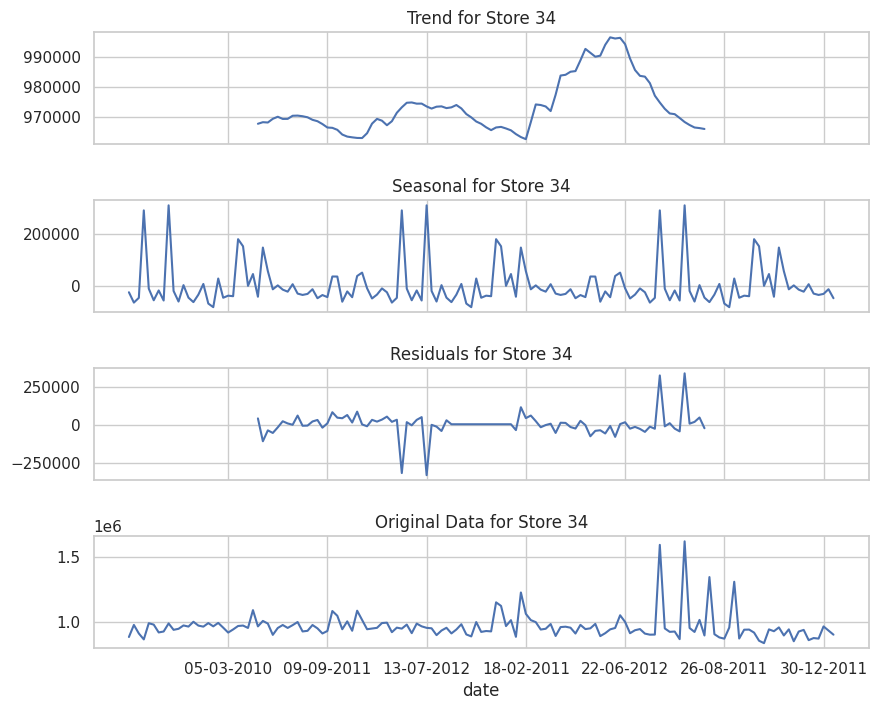



Seasonal Decomposition for Overall Sales Per Week for Store Number 35


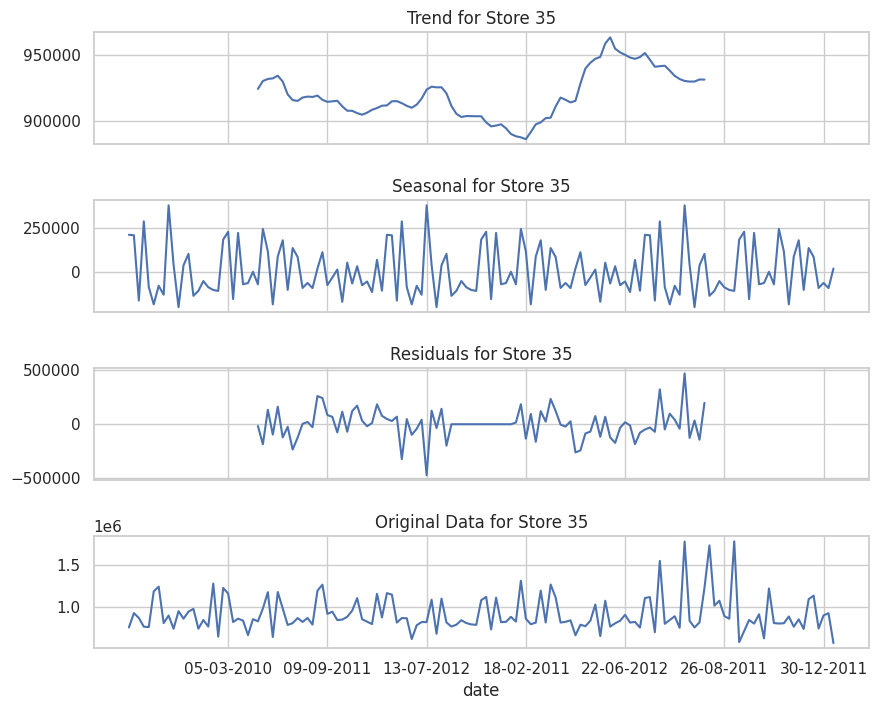



Seasonal Decomposition for Overall Sales Per Week for Store Number 36


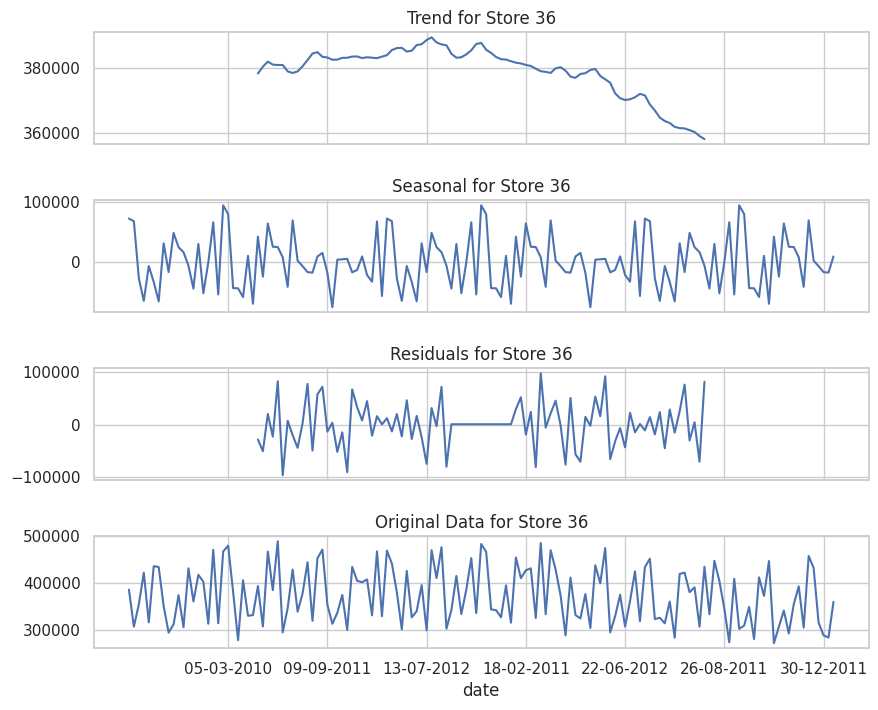



Seasonal Decomposition for Overall Sales Per Week for Store Number 37


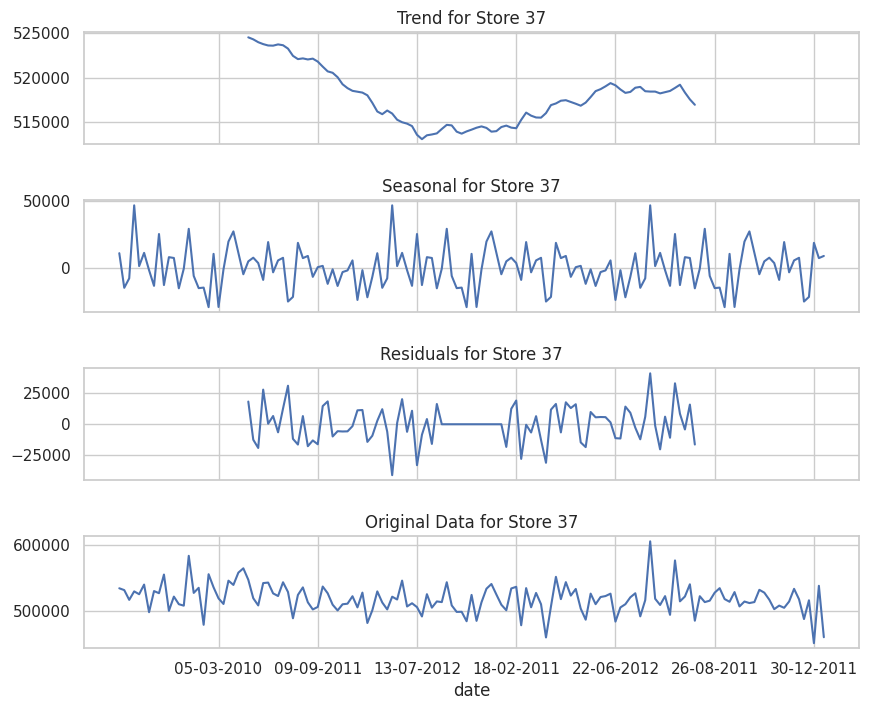



Seasonal Decomposition for Overall Sales Per Week for Store Number 38


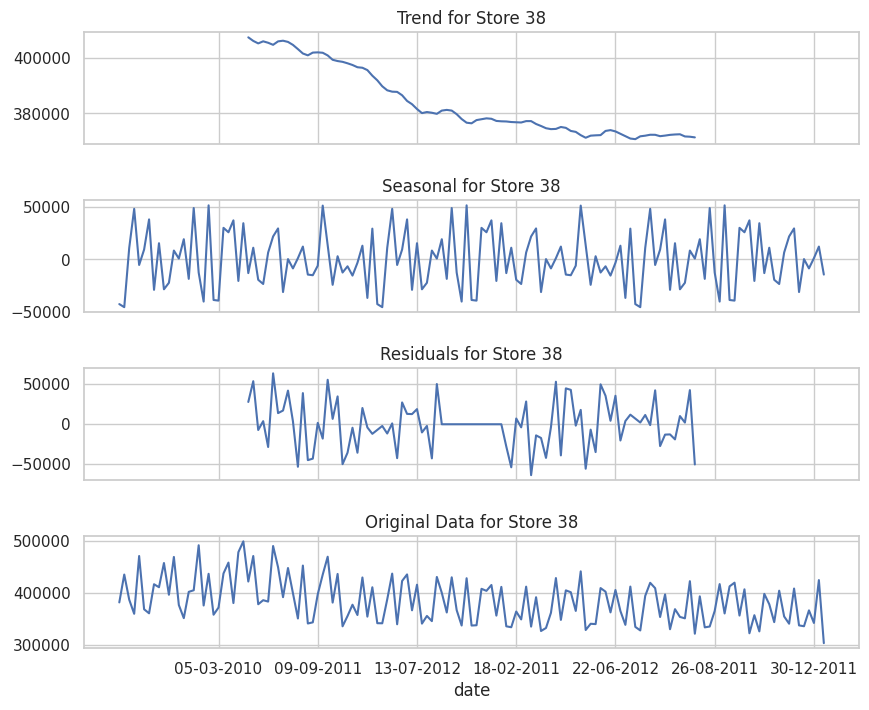



Seasonal Decomposition for Overall Sales Per Week for Store Number 39


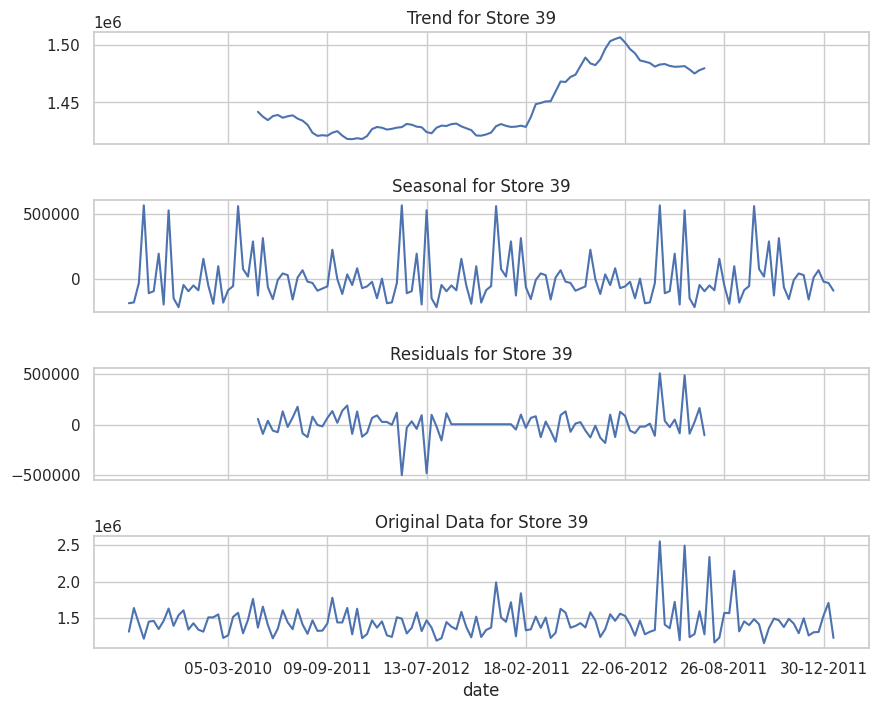



Seasonal Decomposition for Overall Sales Per Week for Store Number 40


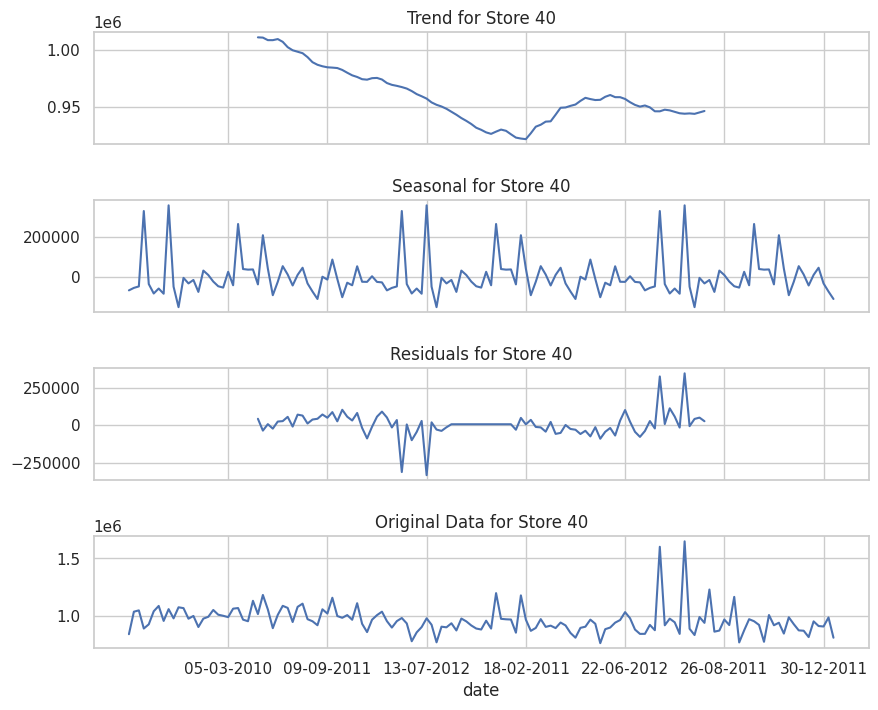



Seasonal Decomposition for Overall Sales Per Week for Store Number 41


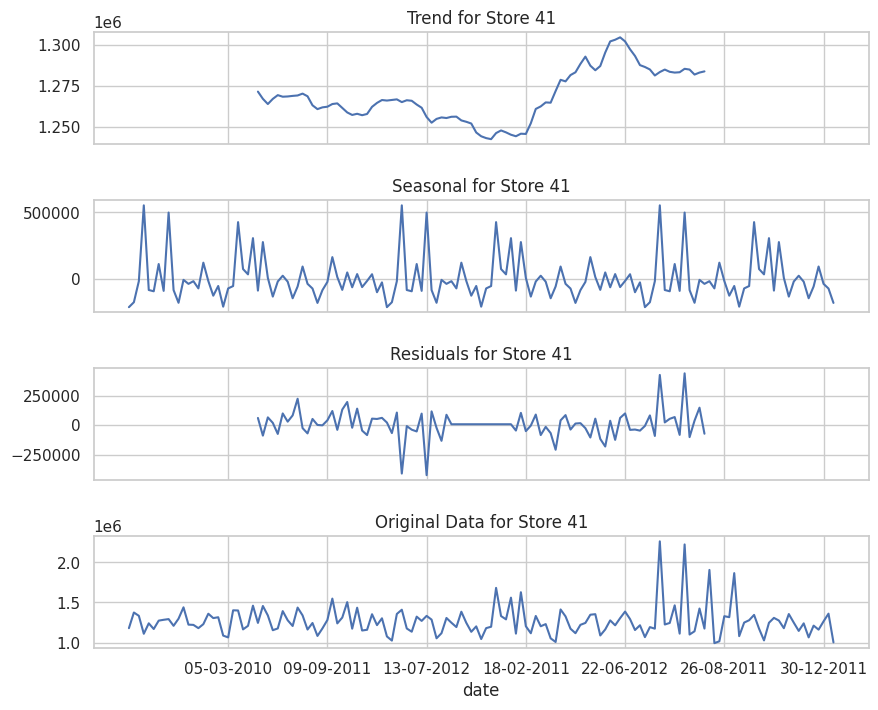



Seasonal Decomposition for Overall Sales Per Week for Store Number 42


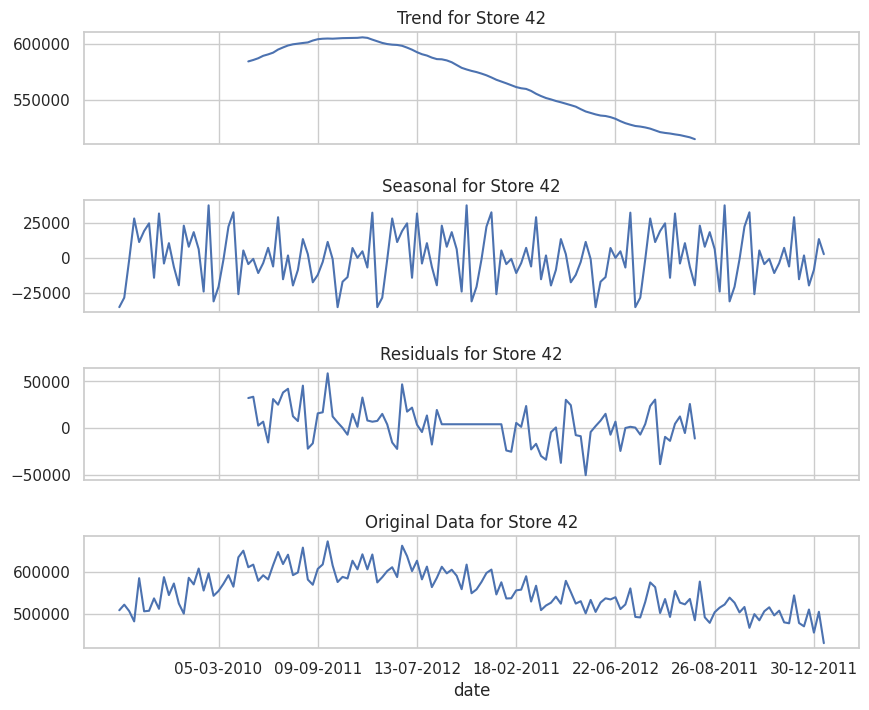



Seasonal Decomposition for Overall Sales Per Week for Store Number 43


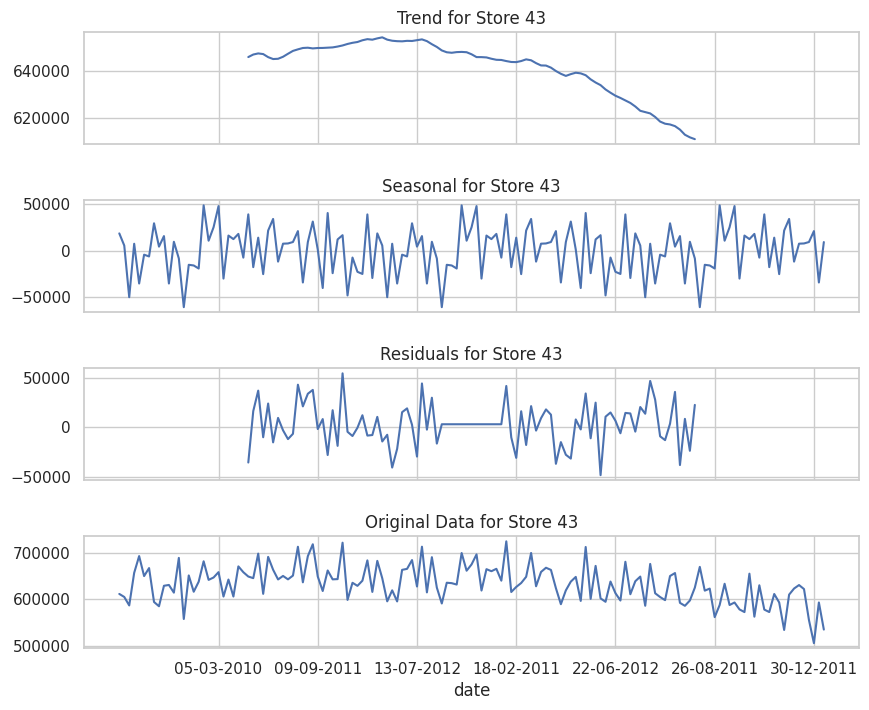



Seasonal Decomposition for Overall Sales Per Week for Store Number 44


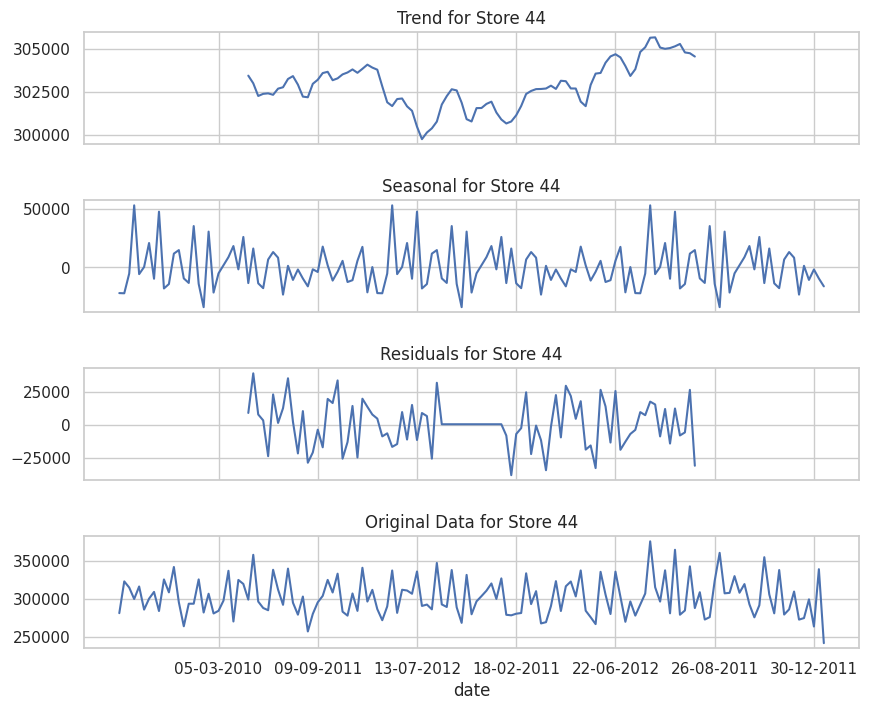



Seasonal Decomposition for Overall Sales Per Week for Store Number 45


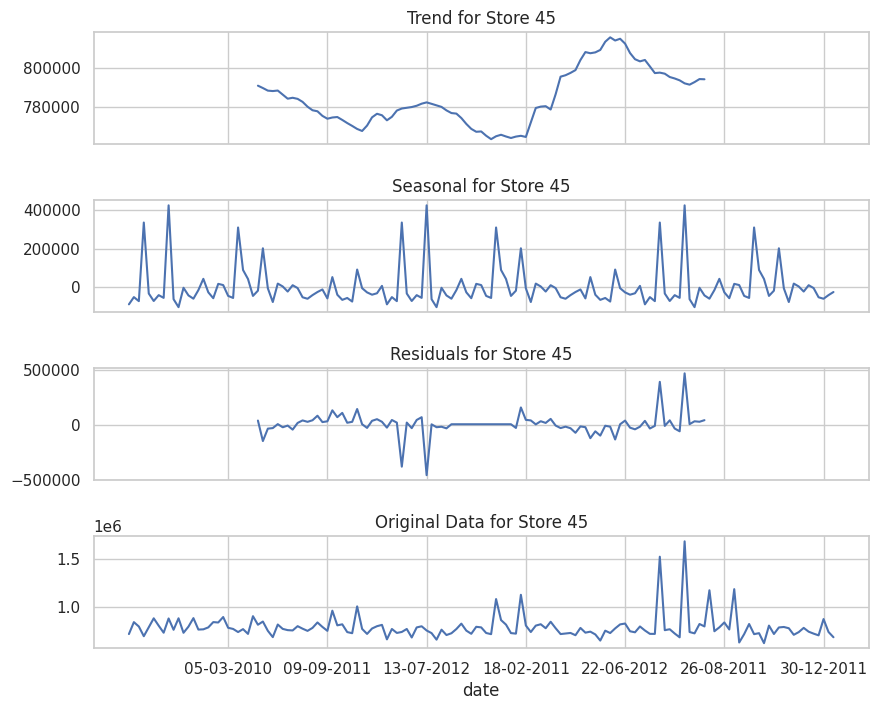

In [27]:
#Checking the seasonality decomposition for all the stores
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose


for i in range(1, 46):
    df1 = df[df['store'] == i]
    df1 = pd.DataFrame(df1.groupby('date')['weekly_sales'].sum().reset_index())
    df_all = df1.copy()
    df_all.columns = ['date', 'weekly_sales']
    df_all['date'] = pd.to_datetime(df_all['date'], dayfirst=True)
    df_all = df_all.sort_values(by='date')
    fig = px.line(df_all, x="date", y="weekly_sales", title=f"Distribution of Overall Sales Per Week for Store Number {i}")
    fig.show()

    print('')
    print('')
    print(f"Seasonal Decomposition for Overall Sales Per Week for Store Number {i}")
    df1['Date'] = pd.to_datetime(df1['date'], dayfirst=True)
    df1 = df1.sort_values(by='date')
    df1 = df1.set_index(['date'])

    all_store_seasonality = seasonal_decompose(df1['weekly_sales'].dropna(), period=52)  # Set period=52 for weekly data

    # Create a figure with subplots to control spacing
    fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

    # Adjust spacing between subplots
    fig.subplots_adjust(hspace=0.5)

    all_store_seasonality.trend.plot(ax=axes[0])
    axes[0].set_title(f'Trend for Store {i}')

    all_store_seasonality.seasonal.plot(ax=axes[1])
    axes[1].set_title(f'Seasonal for Store {i}')

    all_store_seasonality.resid.plot(ax=axes[2])
    axes[2].set_title(f'Residuals for Store {i}')

    axes[3].set_title(f'Original Data for Store {i}')
    df1['weekly_sales'].plot(ax=axes[3])

    plt.show()


#MODEL BUILDING

In [28]:
df_updated = df[['store','date','weekly_sales']]
df_updated

,store,date,weekly_sales
0,1,05-02-2010,1643690.90
1,1,12-02-2010,1641957.44
2,1,19-02-2010,1611968.17
3,1,26-02-2010,1409727.59
4,1,05-03-2010,1554806.68
...,...,...,...
6430,45,28-09-2012,713173.95
6431,45,05-10-2012,733455.07
6432,45,12-10-2012,734464.36
6433,45,19-10-2012,718125.53


In [29]:
df_updated['date'] = pd.to_datetime(df_updated['date'], dayfirst = True)
df_updated.set_index('date', inplace= True)
df_updated

,store,weekly_sales
date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


In [30]:
#to test our model, we will built it on lets say store 9. We will use SARIMAX function to fit the model and test the model
store9 = df_updated[df_updated['store']==9]
store9

,store,weekly_sales
date,,
2010-02-05,9,549505.55
2010-02-12,9,552677.48
2010-02-19,9,511327.90
2010-02-26,9,473773.27
2010-03-05,9,507297.88
...,...,...
2012-09-28,9,516361.06
2012-10-05,9,606755.30
2012-10-12,9,558464.80


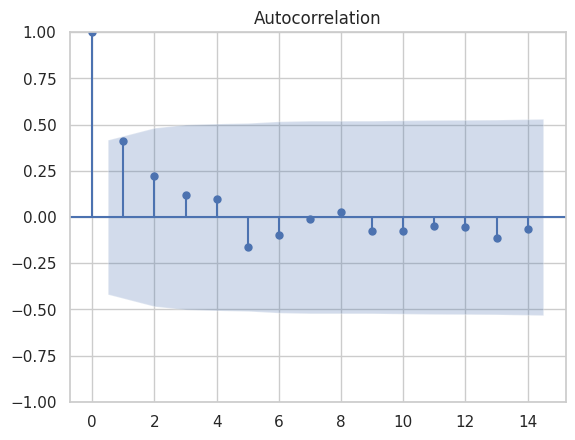

In [31]:
#to implement arima model we need to find, p,d,q value which can be found with the Autocorrelation Chars, ACF and PACF
#finding the AR (Auto Regressive) -p  and MA(Moving Average)- q values and as we have not performed any tranformation step so the d = 0.

from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

acf_plot = acf(store9['weekly_sales'].dropna())
plot_acf(acf_plot);

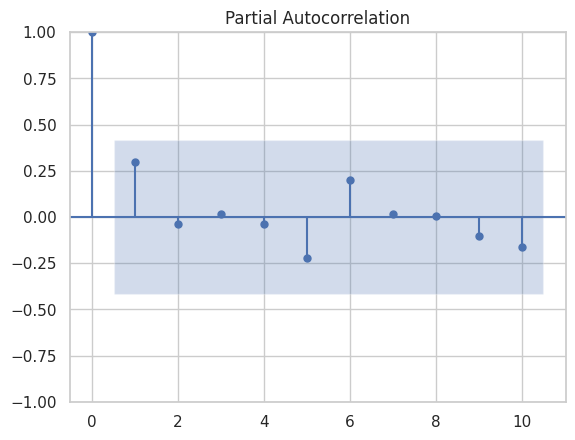

In [32]:
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_pacf

pacf_plot = pacf(store9['weekly_sales'].dropna())
plot_pacf(pacf_plot , lags =10);

In [33]:
#splitting the data into train and test

train9_data = store9.iloc[:120]['weekly_sales']
test9_data = store9.iloc[120:]['weekly_sales']

test9_data

date
2012-05-25    547226.00
2012-06-01    583648.59
2012-06-08    582525.42
2012-06-15    564606.10
2012-06-22    562173.12
2012-06-29    544770.70
2012-07-06    578790.36
2012-07-13    536537.64
2012-07-20    513991.57
2012-07-27    495951.00
2012-08-03    533887.54
2012-08-10    538713.47
2012-08-17    535153.47
2012-08-24    572887.78
2012-08-31    576879.15
2012-09-07    565812.29
2012-09-14    523427.35
2012-09-21    533756.88
2012-09-28    516361.06
2012-10-05    606755.30
2012-10-12    558464.80
2012-10-19    542009.46
2012-10-26    549731.49
Name: weekly_sales, dtype: float64

In [34]:
#importing the ARIMA model

from statsmodels.tsa.arima.model import ARIMA

model_ARIMA = ARIMA(train9_data ,order = (1,0,4))
model_fit = model_ARIMA.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



<Axes: xlabel='date'>

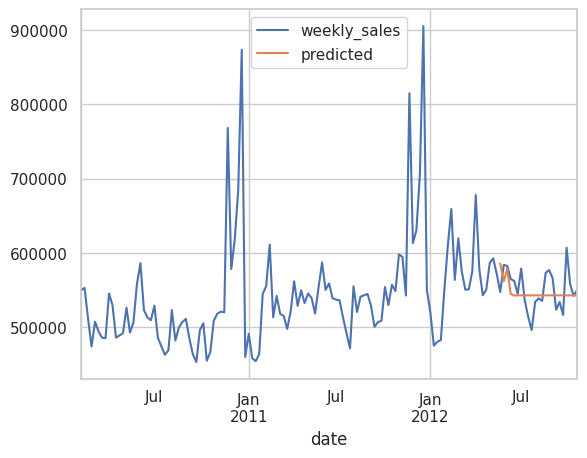

In [35]:
start = len(train9_data)
end = len(train9_data) + len(test9_data) - 1
store9['predicted'] = model_fit.predict(start=start,end=end, dynamic=True)
store9[['weekly_sales','predicted']].plot()

In [36]:
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score
import numpy as np

# Align the predicted values with the test data
predicted_values = store9['predicted'][-len(test9_data):]

# Calculate the Mean Absolute Error (MAE)
mae = mean_absolute_error(test9_data, predicted_values)

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(test9_data, predicted_values)

# Calculate the Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
r2 = r2_score(test9_data, predicted_values)

print(f'R-squared (R2) Score: {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')


R-squared (R2) Score: -0.00
Mean Absolute Error (MAE): 20617.69
Mean Squared Error (MSE): 671199219.32
Root Mean Squared Error (RMSE): 25907.51


As we can observe our ARIMA model failed miserablly to predict the values, so now we will use FB Prophet to build pur model

In [37]:
#Installing fb prophet

In [38]:
pip install prophet

In [39]:
from prophet import Prophet

In [40]:
#Implementing FB Prophet for store 9

df9 = df[df['store']==9][['date','weekly_sales']]
df9['date'] = pd.to_datetime(df9['date'],dayfirst = True)
df9


,date,weekly_sales
1144,2010-02-05,549505.55
1145,2010-02-12,552677.48
1146,2010-02-19,511327.90
1147,2010-02-26,473773.27
1148,2010-03-05,507297.88
...,...,...
1282,2012-09-28,516361.06
1283,2012-10-05,606755.30
1284,2012-10-12,558464.80
1285,2012-10-19,542009.46


In [41]:
df9 = df9.rename(columns ={'date':'ds','weekly_sales':'y'})
df9

,ds,y
1144,2010-02-05,549505.55
1145,2010-02-12,552677.48
1146,2010-02-19,511327.90
1147,2010-02-26,473773.27
1148,2010-03-05,507297.88
...,...,...
1282,2012-09-28,516361.06
1283,2012-10-05,606755.30
1284,2012-10-12,558464.80
1285,2012-10-19,542009.46


In [42]:
model = Prophet( seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,)
model.fit(df9)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/91wz5jw_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/jyc_1b46.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43956', 'data', 'file=/tmp/tmps1qy1zf2/91wz5jw_.json', 'init=/tmp/tmps1qy1zf2/jyc_1b46.json', 'output', 'file=/tmp/tmps1qy1zf2/prophet_modelug55q4fu/prophet_model-20231020143310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:33:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:33:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [43]:
#predicting the future 12 weeks
future = model.make_future_dataframe(periods=12, freq='W')

In [44]:
forecast = model.predict(future)

In [45]:
forecast_store9 = forecast[['ds','yhat_lower','yhat_upper','yhat']]

In [46]:
#Forecasted Values for 12 weeks.

forecasted_values= forecast_store9.tail(12)[['ds','yhat']]
forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
forecasted_values

,ds,yhat
143,2012-10-28,541695
144,2012-11-04,613119
145,2012-11-11,570215
146,2012-11-18,586248
147,2012-11-25,807810
148,2012-12-02,640348
149,2012-12-09,642721
150,2012-12-16,746150
151,2012-12-23,903274
152,2012-12-30,546029


In [47]:
#representation of the values using graph.

from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(model, forecast)

In [48]:
#evaluating the accuracy of our model

#predicted value.
predicted=forecast_store9.iloc[0:143]['yhat']

#Actual value.
actual= df9['y']

#Scoring.
from sklearn.metrics import r2_score , mean_absolute_error

#R2_score of the model.
print('R2_score of model is',r2_score(actual, predicted))

#Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs(np.array(actual) - np.array(predicted)) / np.array(actual)) * 100
print(f'Mean Absolute Percentage Error (MAPE) {mape}')

#Mean absolute Error.
print(f'Mean Absolute error is {mean_absolute_error(actual, predicted)}')

R2_score of model is 0.9310670172236656
Mean Absolute Percentage Error (MAPE) 2.6353258583852974
Mean Absolute error is 14376.591315399537


We can observe from the above accuracy parameters that we are acheving around 93% accuracy

In [49]:
#lets create a function that accepts the store number and gives the 12 weeks predictions

def forecast_sales(store_number):
  df_for_forecast = df[df['store']==store_number][['date','weekly_sales']]
  df_for_forecast['date'] = pd.to_datetime(df_for_forecast['date'],dayfirst = True)

  #renaming the columns
  df_for_forecast = df_for_forecast.rename(columns ={'date':'ds','weekly_sales':'y'})

  #giving the df to the model
  model_new = Prophet( seasonality_prior_scale=50,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.10,
    yearly_seasonality=25,
    growth='linear',
    interval_width=0.95,)
  model_new.fit(df_for_forecast)

  #predicting the future 12 weeks
  future = model_new.make_future_dataframe(periods=12, freq='W')

  forecast = model_new.predict(future)

  forecast_store_number = forecast[['ds','yhat_lower','yhat_upper','yhat']]

  #Forecasted Values for 12 weeks.

  forecasted_values= forecast_store_number.tail(12)[['ds','yhat']]
  forecasted_values['yhat']=forecasted_values['yhat'].astype(int)
  print(forecasted_values)

  print()
  print()
  #representation of the values using graph.

  from prophet.plot import plot_plotly, plot_components_plotly
  return plot_plotly(model_new, forecast)



#lets do the forecasting for store 37

forecast_sales(37)






INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/eosxynp1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/nirjlc1k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56529', 'data', 'file=/tmp/tmps1qy1zf2/eosxynp1.json', 'init=/tmp/tmps1qy1zf2/nirjlc1k.json', 'output', 'file=/tmp/tmps1qy1zf2/prophet_modely2549e1_/prophet_model-20231020143310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:33:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:33:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds    yhat
143 2012-10-28  530914
144 2012-11-04  564987
145 2012-11-11  521614
146 2012-11-18  543591
147 2012-11-25  532051
148 2012-12-02  539745
149 2012-12-09  535040
150 2012-12-16  557277
151 2012-12-23  601851
152 2012-12-30  476184
153 2013-01-06  567035
154 2013-01-13  555514




In [50]:
#forecasting for store 45

forecast_sales(45)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/w8x41fa_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/cgijox4x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62543', 'data', 'file=/tmp/tmps1qy1zf2/w8x41fa_.json', 'init=/tmp/tmps1qy1zf2/cgijox4x.json', 'output', 'file=/tmp/tmps1qy1zf2/prophet_modelwppaqjf_/prophet_model-20231020143310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:33:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:33:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds     yhat
143 2012-10-28   725365
144 2012-11-04   824623
145 2012-11-11   753615
146 2012-11-18   779520
147 2012-11-25  1142213
148 2012-12-02   896133
149 2012-12-09   951861
150 2012-12-16  1124722
151 2012-12-23  1569370
152 2012-12-30   790076
153 2013-01-06   659434
154 2013-01-13   682378




In [51]:
#forecasting for store 33

forecast_sales(33)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/5k3pcxp_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/mam713m8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92989', 'data', 'file=/tmp/tmps1qy1zf2/5k3pcxp_.json', 'init=/tmp/tmps1qy1zf2/mam713m8.json', 'output', 'file=/tmp/tmps1qy1zf2/prophet_modelzq25a45y/prophet_model-20231020143311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:33:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:33:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds    yhat
143 2012-10-28  243027
144 2012-11-04  263212
145 2012-11-11  293159
146 2012-11-18  261805
147 2012-11-25  266888
148 2012-12-02  239737
149 2012-12-09  282734
150 2012-12-16  273328
151 2012-12-23  272150
152 2012-12-30  242991
153 2013-01-06  278707
154 2013-01-13  292846




In [52]:
#forecasting for store 21

forecast_sales(21)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/7zcnq7ym.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/imh0jkna.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21537', 'data', 'file=/tmp/tmps1qy1zf2/7zcnq7ym.json', 'init=/tmp/tmps1qy1zf2/imh0jkna.json', 'output', 'file=/tmp/tmps1qy1zf2/prophet_modelm3wrxey9/prophet_model-20231020143311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:33:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:33:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds     yhat
143 2012-10-28   650890
144 2012-11-04   721969
145 2012-11-11   661261
146 2012-11-18   730322
147 2012-11-25  1147734
148 2012-12-02   779061
149 2012-12-09   844908
150 2012-12-16  1056947
151 2012-12-23  1406340
152 2012-12-30   704218
153 2013-01-06   548992
154 2013-01-13   607327




In [53]:
#forecasting for store 7

forecast_sales(7)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/g16e736n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmps1qy1zf2/afm2qjm9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40377', 'data', 'file=/tmp/tmps1qy1zf2/g16e736n.json', 'init=/tmp/tmps1qy1zf2/afm2qjm9.json', 'output', 'file=/tmp/tmps1qy1zf2/prophet_modelre7hfbdk/prophet_model-20231020143311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:33:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:33:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds     yhat
143 2012-10-28   487764
144 2012-11-04   566951
145 2012-11-11   525318
146 2012-11-18   561081
147 2012-11-25   883734
148 2012-12-02   601794
149 2012-12-09   623824
150 2012-12-16   750709
151 2012-12-23  1046603
152 2012-12-30   793956
153 2013-01-06   674459
154 2013-01-13   591444




**In conclusion we employed Facebook Prophet to forecast sales for the next 12 weeks with an impressive accuracy of around 93%, enabling data-driven decision-making and enhancing future planning and resource allocation.**